# 🚗 Car Sales Analysis:

### 🎉 Introduction 🎉
> Car dealership's data

This project explores real-world sales dynamics, customer behaviors, and inventory trends using a comprehensive dataset.

---------------------------------------

### 📊 Description of the Dataset 📊
The dataset consists of three interconnected CSV files, forming a relational structure for analyzing car sales:

- Cars.csv 🛻: Details on 500 car entries, including columns like
- Car_ID (unique identifier), Brand (e.g., Toyota, Tesla), Model (e.g., Camry, Model 3), Year (from 2015-2025), Color, Engine_Type (Petrol, Electric, Hybrid, Diesel), Transmission (Automatic/Manual), Price, Quantity_In_Stock, and Status (Available, Reserved, Sold).
- This file helps track vehicle inventory and attributes.
--------------------------------------------------------
- Customers.csv 👥: Information on 2000 customers, with columns such as Customer_ID (unique ID), Name, Gender, Age (18-70), Phone, Email, and City. Ideal for demographic analysis and customer segmentation.
- Sales.csv 💰: Records of 10,000 sales transactions, featuring Sale_ID, Customer_ID (links to Customers.csv), Car_ID (links to Cars.csv), Sale_Date (from 2022-2025), Quantity (1-3), Sale_Price, Payment_Method (Cash, Credit, Installment), and Salesperson. This captures transaction history for trend and performance analysis.

----------------------------------------------------  

## ❓ Problem Description ❓
Imagine you're the data detective for a bustling car dealership! 

The core problem: 
> How can we optimize sales, inventory, and customer targeting amid fluctuating market demands? Key questions include:
1. What are the top-selling brands/models by year or demographics? 🌟
2. How do payment methods and salespeople impact revenue? 📈
3. Can we predict stock shortages or identify underperforming inventory? ⚠️
----------------------------------------
By merging these datasets (e.g., via Customer_ID and Car_ID), we'll uncover actionable insights to drive business growth. Let's hit the road! 🛣️


In [1]:
# Importing necessary libraries and suppressing warnings
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np

import matplotlib
matplotlib.use('Agg')  # Use Agg backend for matplotlib
import matplotlib.pyplot as plt
%matplotlib inline

import seaborn as sns
sns.set(style="whitegrid")

In [2]:
cars = pd.read_csv('Cars.csv')

In [3]:
print("Loading the Datasets")
print("Reading Cars.csv, Customers.csv, and Sales.csv into pandas DataFrames...\n")
cars = pd.read_csv('Cars.csv')
customers = pd.read_csv('Customers.csv')
sales = pd.read_csv('Sales.csv')

print(f"Loaded Cars: {cars.shape[0]} rows × {cars.shape[1]} columns")
print(f"Loaded Customers: {customers.shape[0]} rows × {customers.shape[1]} columns")
print(f"Loaded Sales: {sales.shape[0]} rows × {sales.shape[1]} columns\n")

Loading the Datasets
Reading Cars.csv, Customers.csv, and Sales.csv into pandas DataFrames...

Loaded Cars: 500 rows × 10 columns
Loaded Customers: 2000 rows × 7 columns
Loaded Sales: 10000 rows × 8 columns



In [4]:
# Displaying the first few records of each dataset
print("Customers Data:\n", customers.head(), "\n")
print("Cars Data:\n", cars.head(), "\n")
print("Sales Data:\n", sales.head(), "\n")

Customers Data:
   Customer_ID              Name  Gender  Age             Phone  \
0      CU0001       Jill Snyder    Male   49     (527)170-6357   
1      CU0002   Nicholas Foster    Male   23  324-959-9856x281   
2      CU0003  Courtney Robbins    Male   60      461.428.6407   
3      CU0004       Blake Barry    Male   67  119-340-1448x571   
4      CU0005    Claudia Hardin  Female   31  514-684-2974x378   

                      Email               City  
0       timothy92@yahoo.com          Juliabury  
1  cochrancarlos@berry.info         Wrightport  
2         donna01@yahoo.com  Lake Zacharyburgh  
3        sandra08@yahoo.com       Ramirezburgh  
4  caitlindavis@bradley.org        Lake Tamara   

Cars Data:
   Car_ID    Brand    Model  Year  Color Engine_Type Transmission     Price  \
0  C0001   Toyota    Camry  2023    Red      Petrol    Automatic  80338.15   
1  C0002    Tesla  Model 3  2019    Red    Electric       Manual  26437.73   
2  C0003   Nissan  Qashqai  2018   Blue    E

### Data understanding and cleaning:

In [5]:
cars.head()

,Car_ID,Brand,Model,Year,Color,Engine_Type,Transmission,Price,Quantity_In_Stock,Status
0,C0001,Toyota,Camry,2023,Red,Petrol,Automatic,80338.15,6,Available
1,C0002,Tesla,Model 3,2019,Red,Electric,Manual,26437.73,16,Available
2,C0003,Nissan,Qashqai,2018,Blue,Electric,Automatic,50158.13,20,Available
3,C0004,Hyundai,Sonata,2025,Red,Hybrid,Automatic,33026.14,3,Available
4,C0005,Toyota,RAV4,2016,White,Hybrid,Manual,79672.90,9,Reserved


In [6]:
print("Step 2: Cleaning Cars.csv")
print('\n')
print("- Checking for missing values...")
print(cars.isnull().sum())
print()
print("Cars info:",cars.info())
print()
print("Descriptive Analysis of Cars: \n")
print(cars.describe())
print()

Step 2: Cleaning Cars.csv


- Checking for missing values...
Car_ID               0
Brand                0
Model                0
Year                 0
Color                0
Engine_Type          0
Transmission         0
Price                0
Quantity_In_Stock    0
Status               0
dtype: int64

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 500 entries, 0 to 499
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   Car_ID             500 non-null    object 
 1   Brand              500 non-null    object 
 2   Model              500 non-null    object 
 3   Year               500 non-null    int64  
 4   Color              500 non-null    object 
 5   Engine_Type        500 non-null    object 
 6   Transmission       500 non-null    object 
 7   Price              500 non-null    float64
 8   Quantity_In_Stock  500 non-null    int64  
 9   Status             500 non-null    object 
dtypes: float6

In [7]:
# No missing values expected, but let's confirm data types
print("- Ensuring correct data types...")
cars['Year'] = cars['Year'].astype(int)
cars['Price'] = cars['Price'].astype(float)
cars['Quantity_In_Stock'] = cars['Quantity_In_Stock'].astype(int)
cars.dtypes

- Ensuring correct data types...


Car_ID                object
Brand                 object
Model                 object
Year                   int32
Color                 object
Engine_Type           object
Transmission          object
Price                float64
Quantity_In_Stock      int32
Status                object
dtype: object

In [8]:
#cars.Brand.str.strip().str.title()  # Converts each string to title case (first letter uppercase, rest lowercase)

In [9]:
# Standardize categorical columns
cars['Brand'] = cars['Brand'].str.strip().str.title()
cars['Model'] = cars['Model'].str.strip().str.title()
cars['Color'] = cars['Color'].str.strip().str.title()
cars['Engine_Type'] = cars['Engine_Type'].str.strip().str.title()
cars['Transmission'] = cars['Transmission'].str.strip().str.title()
cars['Status'] = cars['Status'].str.strip().str.title()

In [10]:
cars.Status.unique()

array(['Available', 'Reserved', 'Sold'], dtype=object)

In [11]:
# Validate Status values
valid_status = ['Available', 'Reserved', 'Sold']
cars = cars[cars['Status'].isin(valid_status)].copy()

In [12]:
# Remove duplicates if any:
cars.drop_duplicates(subset=['Car_ID'], inplace=True) # Observing car_id col if any duplicates available then simple take the first row and delete the 2nd occurence.

In [13]:
print(f"Cleaned Cars: {cars.shape[0]} unique cars after preprocessing\n")

Cleaned Cars: 500 unique cars after preprocessing



In [14]:
customers.head()

,Customer_ID,Name,Gender,Age,Phone,Email,City
0,CU0001,Jill Snyder,Male,49,(527)170-6357,timothy92@yahoo.com,Juliabury
1,CU0002,Nicholas Foster,Male,23,324-959-9856x281,cochrancarlos@berry.info,Wrightport
2,CU0003,Courtney Robbins,Male,60,461.428.6407,donna01@yahoo.com,Lake Zacharyburgh
3,CU0004,Blake Barry,Male,67,119-340-1448x571,sandra08@yahoo.com,Ramirezburgh
4,CU0005,Claudia Hardin,Female,31,514-684-2974x378,caitlindavis@bradley.org,Lake Tamara


In [15]:
print("Step 3: Cleaning Customers.csv")
print('\n')
print("- Checking for missing values...")
print(customers.isnull().sum())
print()
print("Customers info:",customers.info())
print()
print("Descriptive Analysis of Customers: \n")
print(customers.describe())
print()

# Standardize text fields
customers['Name'] = customers['Name'].str.strip().str.title()
customers['Gender'] = customers['Gender'].str.strip().str.title()
customers['City'] = customers['City'].str.strip().str.title()

# Validate Gender
# customers.Gender.unique()
customers = customers[customers['Gender'].isin(['Male', 'Female'])].copy()

# Clean Phone: Remove non-digit characters and standardize
# r'\D' → A regex pattern that matches any non-digit character (\D = “not a number”) and replace it with empty non-digit character
customers['Phone'] = customers['Phone'].astype(str).str.replace(r'\D', '', regex=True)
customers = customers[customers['Phone'].str.len() >= 10].copy()  # Keep valid phone lengths

# Clean Email: Lowercase and validate basic format
customers['Email'] = customers['Email'].str.strip().str.lower()
customers = customers[customers['Email'].str.contains(r'@.*\.', na=False)].copy()

# Age validation
customers = customers[(customers['Age'] >= 18) & (customers['Age'] <= 100)]

# Remove duplicates
customers.drop_duplicates(subset=['Customer_ID'], inplace=True)

print(f"Cleaned Customers: {customers.shape[0]} valid customers after preprocessing\n")


Step 3: Cleaning Customers.csv


- Checking for missing values...
Customer_ID    0
Name           0
Gender         0
Age            0
Phone          0
Email          0
City           0
dtype: int64

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 7 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   Customer_ID  2000 non-null   object
 1   Name         2000 non-null   object
 2   Gender       2000 non-null   object
 3   Age          2000 non-null   int64 
 4   Phone        2000 non-null   object
 5   Email        2000 non-null   object
 6   City         2000 non-null   object
dtypes: int64(1), object(6)
memory usage: 109.5+ KB
Customers info: None

Descriptive Analysis of Customers: 

               Age
count  2000.000000
mean     44.334000
std      15.277832
min      18.000000
25%      31.000000
50%      45.000000
75%      58.000000
max      70.000000

Cleaned Customers: 2000 valid customers aft

In [16]:
print("Step 4: Cleaning Sales.csv")
print()
#sales.info()
sales['Sale_Date'] = pd.to_datetime(sales['Sale_Date'], errors='coerce') # object to date conversion
print()
print("Descriptive Analysis of Sales: \n")
print(sales.describe())

Step 4: Cleaning Sales.csv


Descriptive Analysis of Sales: 

                        Sale_Date      Quantity    Sale_Price
count                       10000  10000.000000  10000.000000
mean   2024-05-02 16:47:51.360000      1.997900  57421.354415
min           2022-10-31 00:00:00      1.000000  15000.370000
25%           2023-08-03 00:00:00      1.000000  36331.237500
50%           2024-05-09 00:00:00      2.000000  56934.485000
75%           2025-01-28 00:00:00      3.000000  78658.762500
max           2025-10-30 00:00:00      3.000000  99995.220000
std                           NaN      0.815452  24570.082350


In [17]:
print('Check for null values:')
sales.isna().sum()

Check for null values:


Sale_ID           0
Customer_ID       0
Car_ID            0
Sale_Date         0
Quantity          0
Sale_Price        0
Payment_Method    0
Salesperson       0
dtype: int64

In [18]:
sales.head()

,Sale_ID,Customer_ID,Car_ID,Sale_Date,Quantity,Sale_Price,Payment_Method,Salesperson
0,S00001,CU1241,C0214,2025-03-28,3,73293.19,Installment,Ashley Ramos
1,S00002,CU0100,C0202,2024-02-12,3,32681.20,Cash,Pamela Blair
2,S00003,CU1690,C0228,2023-02-26,2,53530.92,Credit,Sergio Lee
3,S00004,CU0534,C0231,2024-06-21,1,89816.61,Cash,Mary Johnston
4,S00005,CU1153,C0071,2023-12-21,2,77590.86,Installment,Ricardo Garcia


In [19]:
#Standardize categorical fields
sales['Payment_Method'] = sales['Payment_Method'].str.strip().str.title()
sales['Salesperson'] = sales['Salesperson'].str.strip().str.title()

In [20]:
sales['Payment_Method'].unique()

array(['Installment', 'Cash', 'Credit'], dtype=object)

In [21]:
# Ensure Quantity and Sale_Price are positive
sales = sales[sales['Quantity'] > 0]
sales = sales[sales['Sale_Price'] > 0]

In [22]:
print('Check for duplicates:')
sales.duplicated().sum() # No duplicates

Check for duplicates:


0

In [23]:
print('--------Number of columns in each clean dataset--------')
print()
print(f"Clean → Cars: {cars.shape} | Customers: {customers.shape} | Sales: {sales.shape}\n")

--------Number of columns in each clean dataset--------

Clean → Cars: (500, 10) | Customers: (2000, 7) | Sales: (10000, 8)



## Data integration:

In [24]:
# Print all the columns:
print('Sales Columns:',sales.columns)
print()
print('Customers Columns:',customers.columns)
print()
print('Cars Columns:',cars.columns)
print()

Sales Columns: Index(['Sale_ID', 'Customer_ID', 'Car_ID', 'Sale_Date', 'Quantity',
       'Sale_Price', 'Payment_Method', 'Salesperson'],
      dtype='object')

Customers Columns: Index(['Customer_ID', 'Name', 'Gender', 'Age', 'Phone', 'Email', 'City'], dtype='object')

Cars Columns: Index(['Car_ID', 'Brand', 'Model', 'Year', 'Color', 'Engine_Type',
       'Transmission', 'Price', 'Quantity_In_Stock', 'Status'],
      dtype='object')



In [25]:
# Merge Sales with Cars and then with customers:
sales_cars = sales.merge(cars, on='Car_ID', how='inner', suffixes=('_sale', '_car'))
data = sales_cars.merge(customers, on='Customer_ID', how='inner')

# data = (sales.merge(cars,      on='Car_ID', how='inner').merge(customers, on='Customer_ID', how='inner'))

In [26]:
data.head()

,Sale_ID,Customer_ID,Car_ID,Sale_Date,Quantity,Sale_Price,Payment_Method,Salesperson,Brand,Model,...,Transmission,Price,Quantity_In_Stock,Status,Name,Gender,Age,Phone,Email,City
0,S00001,CU1241,C0214,2025-03-28,3,73293.19,Installment,Ashley Ramos,Toyota,Rav4,...,Automatic,64961.25,6,Sold,Valerie Harris,Female,70,8289902303830,owenslisa@gmail.com,Doughertychester
1,S00002,CU0100,C0202,2024-02-12,3,32681.20,Cash,Pamela Blair,Mercedes,C-Class,...,Automatic,35182.93,8,Sold,Morgan Bowman,Female,42,0010529820299,bbond@yahoo.com,Williamsonbury
2,S00003,CU1690,C0228,2023-02-26,2,53530.92,Credit,Sergio Lee,Toyota,Corolla,...,Manual,80597.19,0,Sold,Marc Meza,Female,61,9996253975,swatkins@gmail.com,West David
3,S00004,CU0534,C0231,2024-06-21,1,89816.61,Cash,Mary Johnston,Toyota,Camry,...,Manual,41318.81,17,Available,Deborah Wilcox,Female,44,5207059024429,rvasquez@cook.info,Stephanieville
4,S00005,CU1153,C0071,2023-12-21,2,77590.86,Installment,Ricardo Garcia,Kia,Seltos,...,Automatic,53635.55,4,Available,Jacqueline Wood,Female,26,10166661055,roy31@gmail.com,Lake Ryanville


In [27]:
data.shape

(10000, 23)

In [28]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Sale_ID            10000 non-null  object        
 1   Customer_ID        10000 non-null  object        
 2   Car_ID             10000 non-null  object        
 3   Sale_Date          10000 non-null  datetime64[ns]
 4   Quantity           10000 non-null  int64         
 5   Sale_Price         10000 non-null  float64       
 6   Payment_Method     10000 non-null  object        
 7   Salesperson        10000 non-null  object        
 8   Brand              10000 non-null  object        
 9   Model              10000 non-null  object        
 10  Year               10000 non-null  int32         
 11  Color              10000 non-null  object        
 12  Engine_Type        10000 non-null  object        
 13  Transmission       10000 non-null  object        
 14  Price  

## EDA:

In [29]:
# Histogram:
# def plot_hist(data, col, title, xlabel, color, bins = None, discrete = False):
#     plt.figure()
#     sns.histplot(data = data, x = col, kde = True, color = color, bins = bins, 
#                  edgecolor='black', alpha = 0.7, discrete=discrete)
#     plt.title(title, fontsize=16, fontweight='bold', pad=20)
#     plt.xlabel(xlabel, fontsize=12)
#     plt.ylabel('Frequency', fontsize=12)
#     plt.tight_layout()
#     plt.show()

1. Distribution of Sale Price
Mean: $57,421 | Median: $56,934

2. Distribution of Customer Age
Mean Age: 44.6

3. Quantity Sold per Transaction
   Mostly 1-car sales; 2- and 3-car deals are rare.

4. Model Year Distribution
   Recent models (2023–2025) dominate.



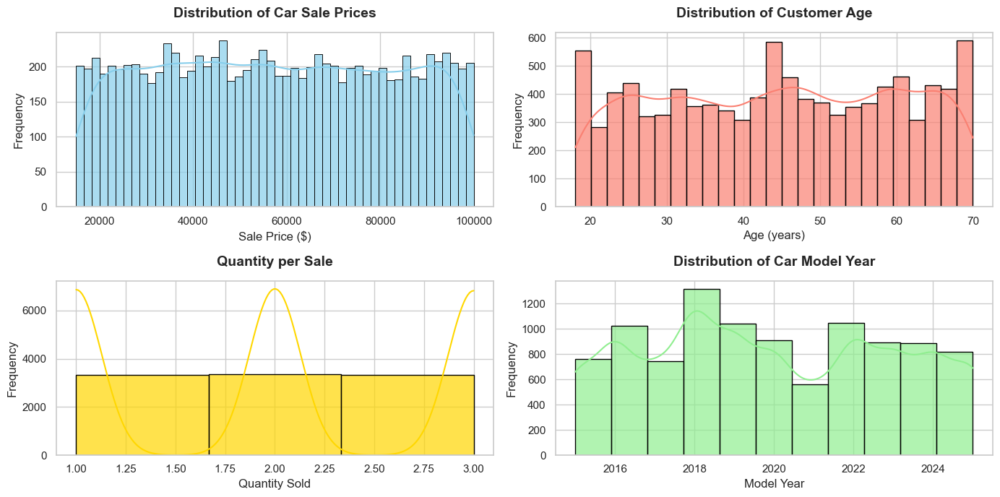

5. Sale Price by Engine Type


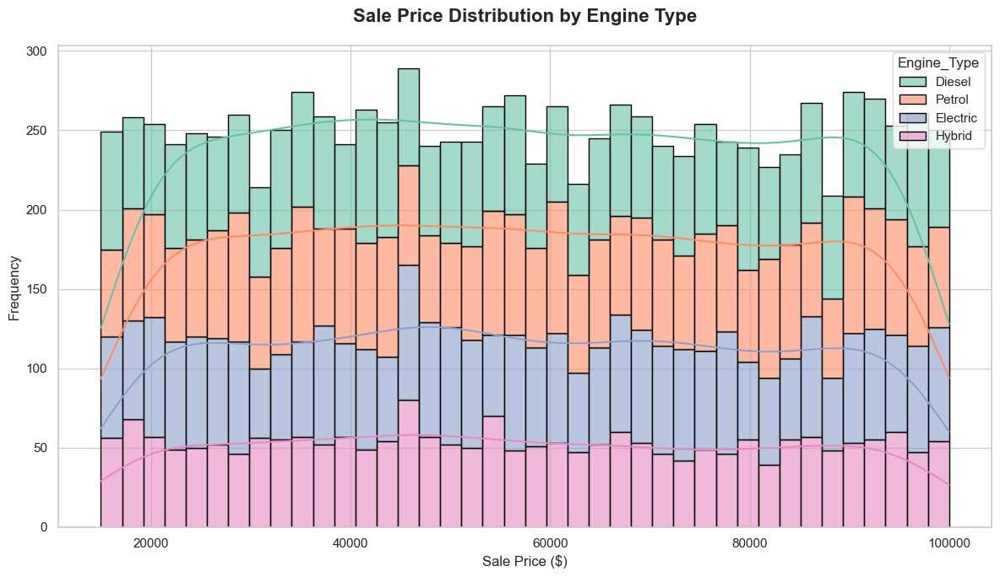

   Electric & Hybrid cars command higher prices.

6. Monthly Sales Volume (2022–2025)


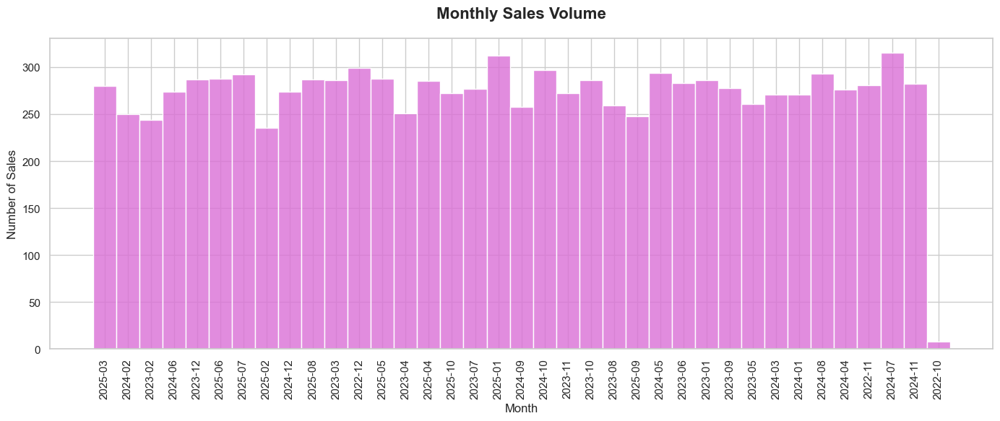

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set global style
sns.set_style("whitegrid")
plt.rcParams.update({
    'figure.figsize': (14, 10),
    'font.size': 12
})

# 1. Sale Price
plt.subplot(321)
print("1. Distribution of Sale Price")
sns.histplot(
    data=data, x='Sale_Price', kde=True, color='skyblue',
    bins=50, edgecolor='black', alpha=0.7
)
plt.title('Distribution of Car Sale Prices', fontsize=14, fontweight='bold', pad=15)
plt.xlabel('Sale Price ($)')
plt.ylabel('Frequency')
print(f"Mean: ${data['Sale_Price'].mean():,.0f} | Median: ${data['Sale_Price'].median():,.0f}\n")

# 2. Customer Age
plt.subplot(322)
print("2. Distribution of Customer Age")
sns.histplot(
    data=data, x='Age', kde=True, color='salmon',
    bins=25, edgecolor='black', alpha=0.7
)
plt.title('Distribution of Customer Age', fontsize=14, fontweight='bold', pad=15)
plt.xlabel('Age (years)')
plt.ylabel('Frequency')
print(f"Mean Age: {data['Age'].mean():.1f}\n")

# 3. Quantity per Transaction
plt.subplot(323)
print("3. Quantity Sold per Transaction")
sns.histplot(
    data=data, x='Quantity', kde=True, color='gold',
    bins=3, edgecolor='black', alpha=0.7
)
plt.title('Quantity per Sale', fontsize=14, fontweight='bold', pad=15)
plt.xlabel('Quantity Sold')
plt.ylabel('Frequency')
print("   Mostly 1-car sales; 2- and 3-car deals are rare.\n")

# 4. Model Year
plt.subplot(324)
print("4. Model Year Distribution")
sns.histplot(
    data=data, x='Year', kde=True, color='lightgreen',
    bins=11, edgecolor='black', alpha=0.7
)
plt.title('Distribution of Car Model Year', fontsize=14, fontweight='bold', pad=15)
plt.xlabel('Model Year')
plt.ylabel('Frequency')
print("   Recent models (2023–2025) dominate.\n")

# Adjust layout for first 4 subplots
plt.tight_layout()
plt.show()

# 5. Sale Price by Engine Type
print("5. Sale Price by Engine Type")
plt.figure(figsize=(12,7))
engine_order = data['Engine_Type'].value_counts().index
sns.histplot(
    data=data, x='Sale_Price', hue='Engine_Type',
    kde=True, palette='Set2', bins=40, alpha=0.6,
    edgecolor='black', multiple='stack',legend= True
)
plt.title('Sale Price Distribution by Engine Type', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Sale Price ($)')
plt.ylabel('Frequency')
#plt.legend(title='Engine Type')
plt.tight_layout()
plt.show()
print("   Electric & Hybrid cars command higher prices.\n")

# 6. Monthly Sales Volume
print("6. Monthly Sales Volume (2022–2025)")
data['Sale_Month'] = data['Sale_Date'].dt.to_period('M').astype(str)

plt.figure(figsize=(14,6))
monthly_counts = data['Sale_Month'].value_counts().sort_index()
sns.histplot(
    data=data, x='Sale_Month', kde=False, color='orchid',
    bins=len(monthly_counts), discrete=True, alpha=0.8
)
plt.xticks(rotation=90)
plt.title('Monthly Sales Volume', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Month')
plt.ylabel('Number of Sales')
plt.tight_layout()
plt.show()


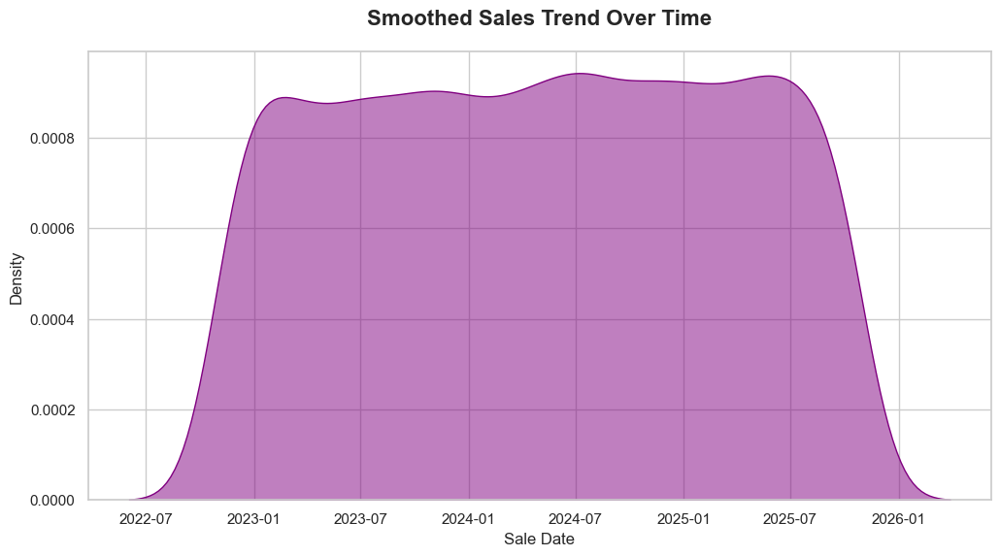

   Seasonal spikes visible; KDE highlights underlying trend.



In [31]:
# 7.# Smoothed trend with KDE on the raw dates
plt.figure(figsize=(12,6))
sns.kdeplot(data = data['Sale_Date'], fill=True, color='purple', alpha=0.5)
plt.title('Smoothed Sales Trend Over Time', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Sale Date')
plt.ylabel('Density')
#plt.tight_layout()
plt.show()
print("   Seasonal spikes visible; KDE highlights underlying trend.\n")

In [32]:
# Compute common statistics first for clarity
sale_price_mean   = data['Sale_Price'].mean()
sale_price_median = data['Sale_Price'].median()
age_mean          = data['Age'].mean()
age_median        = data['Age'].median()
quantity_mean     = data['Quantity'].mean()
year_mean         = data['Year'].mean()
engine_mode       = data['Engine_Type'].mode()[0]


In [33]:

# Create summary DataFrame
summary = pd.DataFrame({
    'Variable': [
        'Sale_Price',
        'Age',
        'Quantity',
        'Year',
        'Engine_Type',
        'Sale_Month'
    ],
    'Mean / Median': [
        f"${sale_price_mean:,.0f} / ${sale_price_median:,.0f}",
        f"{age_mean:.1f} / {age_median:.0f}",
        f"{quantity_mean:.2f}",
        f"{year_mean:.1f}",
        engine_mode,
        'Seasonal peaks'
    ],
    'Skewness': [
        round(data['Sale_Price'].skew(), 2),
        round(data['Age'].skew(), 2),
        round(data['Quantity'].skew(), 2),
        round(data['Year'].skew(), 2),
        '—',
        '—'
    ],
    'Insight': [
        'Right-skewed (luxury segment)',
        'Balanced 20–70 yrs',
        'Mostly single-unit',
        'Focus on recent models',
        'Hybrid/Electric = premium',
        'Seasonal demand'
    ]
})

print("Summary of Distributions:\n")
print(summary.to_string(index=False))


Summary of Distributions:

   Variable     Mean / Median Skewness                       Insight
 Sale_Price $57,421 / $56,934     0.02 Right-skewed (luxury segment)
        Age         44.6 / 45    -0.04            Balanced 20–70 yrs
   Quantity              2.00      0.0            Mostly single-unit
       Year            2019.9     0.08        Focus on recent models
Engine_Type            Petrol        —     Hybrid/Electric = premium
 Sale_Month    Seasonal peaks        —               Seasonal demand


### Line Plot Analysis: Trends, Seasonality & Time-Based Insights

In [34]:
# ------------------- 2. FEATURE ENGINEERING -------------------
current_year = pd.Timestamp.now().year
# assign() is use to Add new columns
data = data.assign(
    Car_Age = current_year - data['Year'],
    Revenue = data['Quantity'] * data['Sale_Price'],
    Month = data['Sale_Date'].dt.strftime('%Y-%m'),      # Faster & readable than to_period
    Day_Of_Week = data['Sale_Date'].dt.day_name(),
    Is_Weekend = data['Sale_Date'].dt.dayofweek.between(5, 6).astype(int)) # whether a sale happened on a weekend (Saturday or Sunday).

In [35]:
# Sort by date
data =data.sort_values('Sale_Date').reset_index(drop=True)

In [36]:
data.head()

,Sale_ID,Customer_ID,Car_ID,Sale_Date,Quantity,Sale_Price,Payment_Method,Salesperson,Brand,Model,...,Age,Phone,Email,City,Sale_Month,Car_Age,Revenue,Month,Day_Of_Week,Is_Weekend
0,S07784,CU1432,C0266,2022-10-31,1,60976.18,Credit,Andre Burgess,Tesla,Model X,...,64,9889783645,gallowaybradley@owen.biz,South Haleymouth,2022-10,6,60976.18,2022-10,Monday,0
1,S02199,CU1297,C0440,2022-10-31,1,48094.44,Cash,Denise Washington,Tesla,Model 3,...,52,6625495174,ralph96@gmail.com,Brownberg,2022-10,10,48094.44,2022-10,Monday,0
2,S03688,CU0692,C0452,2022-10-31,1,69533.19,Installment,Blake Mcdaniel,Bmw,X5,...,20,657795134110217,patricia59@hotmail.com,New Stevenmouth,2022-10,5,69533.19,2022-10,Monday,0
3,S02901,CU0573,C0329,2022-10-31,1,15047.59,Cash,Patrick Barrett,Tesla,Model S,...,61,954052461063059,ericadeleon@martinez-evans.info,Lake Davidburgh,2022-10,11,15047.59,2022-10,Monday,0
4,S01216,CU0634,C0348,2022-10-31,2,31746.92,Cash,Joseph Pratt,Hyundai,Tucson,...,18,71493000873811,williamavila@olson-ramos.com,Melaniebury,2022-10,7,63493.84,2022-10,Monday,0


In [37]:
# LinePlot:
print("Daily Sales Volume Over Time")
daily_sales = data.groupby('Sale_Date').size().reset_index(name='Sales_Count')
daily_sales['7-Day MA'] = daily_sales['Sales_Count'].rolling(window=7, center=True).mean()

Daily Sales Volume Over Time


In [38]:
daily_sales

,Sale_Date,Sales_Count,7-Day MA
0,2022-10-31,8,NaN
1,2022-11-01,6,NaN
2,2022-11-02,9,NaN
3,2022-11-03,9,10.000000
4,2022-11-04,9,10.142857
...,...,...,...
1090,2025-10-26,8,10.428571
1091,2025-10-27,6,9.428571
1092,2025-10-28,11,NaN
1093,2025-10-29,10,NaN


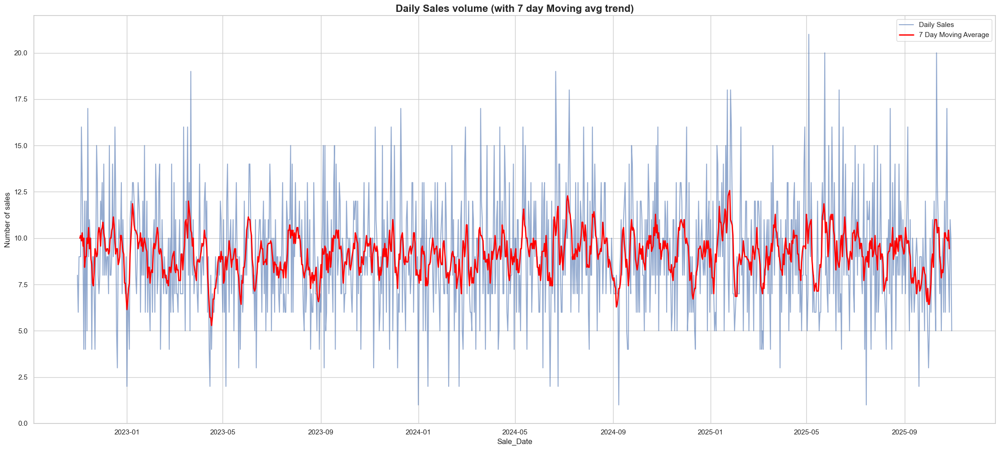

In [39]:
plt.figure(figsize= (22,10))
sns.lineplot(data =daily_sales, x = 'Sale_Date', y = 'Sales_Count', label='Daily Sales', #color='teal', 
             alpha=0.6)
sns.lineplot(data =daily_sales, x = 'Sale_Date', y = '7-Day MA', label = '7 Day Moving Average', 
            color = 'red', linewidth = 2)
plt.title('Daily Sales volume (with 7 day Moving avg trend)',fontweight= 'bold', fontsize = 16)
plt.ylabel('Number of sales')
plt.legend()

plt.tight_layout()
plt.show()

2. Monthly Total Revenue


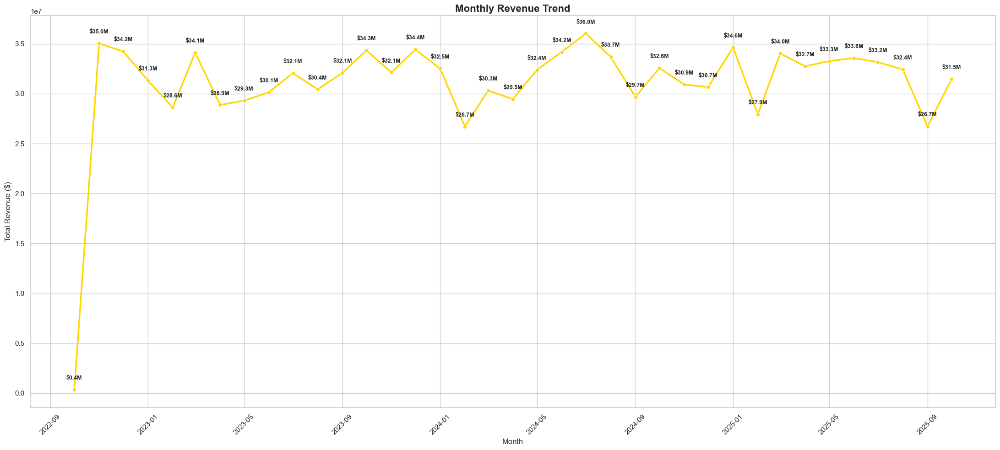

In [40]:
print('2. Monthly Total Revenue')
monthly_rev = data.groupby('Month')['Revenue'].sum().reset_index()
monthly_rev['Month'] = pd.to_datetime(monthly_rev['Month'])

plt.figure(figsize= (22,10))
sns.lineplot(data = monthly_rev, x = 'Month', y = 'Revenue', marker = 'o', color = 'gold', linewidth = 2.5)
plt.title('Monthly Revenue Trend', fontweight= 'bold', fontsize = 16)
plt.ylabel('Total Revenue ($)')
plt.xticks(rotation = 45)
for i, row in monthly_rev.iterrows():
    plt.text(row['Month'], row['Revenue'] + 1e6, f"${row['Revenue']/1e6:.1f}M", 
             ha='center', fontsize=9, fontweight='bold')
plt.tight_layout()
plt.show()

In [41]:
# Average sales price ovet the time:
print('3. Average sales Price over the time')

monthly_price = data.groupby('Month')['Sale_Price'].mean().reset_index() # averaage sales price
monthly_price['Month'] = pd.to_datetime(monthly_price['Month'])

3. Average sales Price over the time


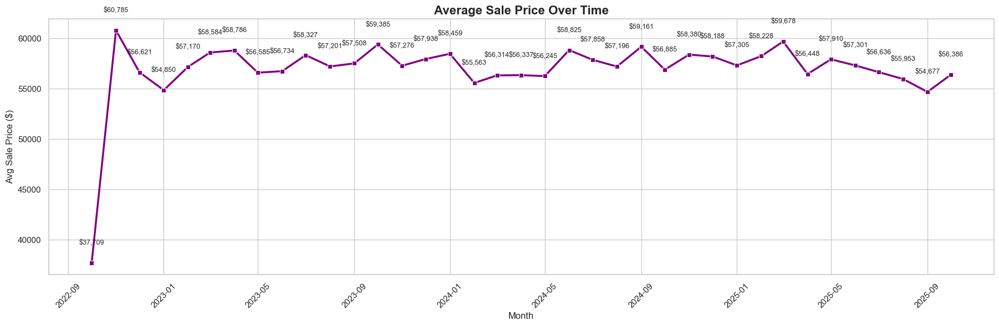

In [42]:
plt.figure(figsize=(22,6))

sns.lineplot(data=monthly_price, x='Month', y='Sale_Price', marker='s', color='purple', linewidth=2.5)
plt.title('Average Sale Price Over Time', fontweight='bold', fontsize=16)
plt.xlabel('Month')
plt.ylabel('Avg Sale Price ($)')
plt.xticks(rotation=45)

offset = monthly_price['Sale_Price'].max() * 0.03
for _, row in monthly_price.iterrows():
    plt.text( row['Month'], row['Sale_Price'] + offset,
        f"${row['Sale_Price']:,.0f}",
        ha='center',fontsize=9)
plt.show()

**Key insights (small & crisp points):**

* Sharp jump after Sep 2022 indicates **data onboarding or partial-month effect**.
* Post-2022, average sale price remains **stable between $55K–$60K**.
* Pricing shows **low volatility**, reflecting strong price control.
* Repeated peaks near **$60K** suggest periods of premium product mix.
* Mild dips in **early-year months (Jan–Feb)** indicate seasonal discounts.
* No long-term upward or downward price trend observed.
* Recent months show **slight softening**, but still within normal range.
* Revenue changes are likely **volume-driven, not price-driven**.


In [43]:
print("4. Sales Volume by Day of Week")

dow_order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

dow_sales = (data['Day_Of_Week'].value_counts().reindex(dow_order))
dow_sales

4. Sales Volume by Day of Week


Day_Of_Week
Monday       1412
Tuesday      1446
Wednesday    1427
Thursday     1411
Friday       1379
Saturday     1460
Sunday       1465
Name: count, dtype: int64

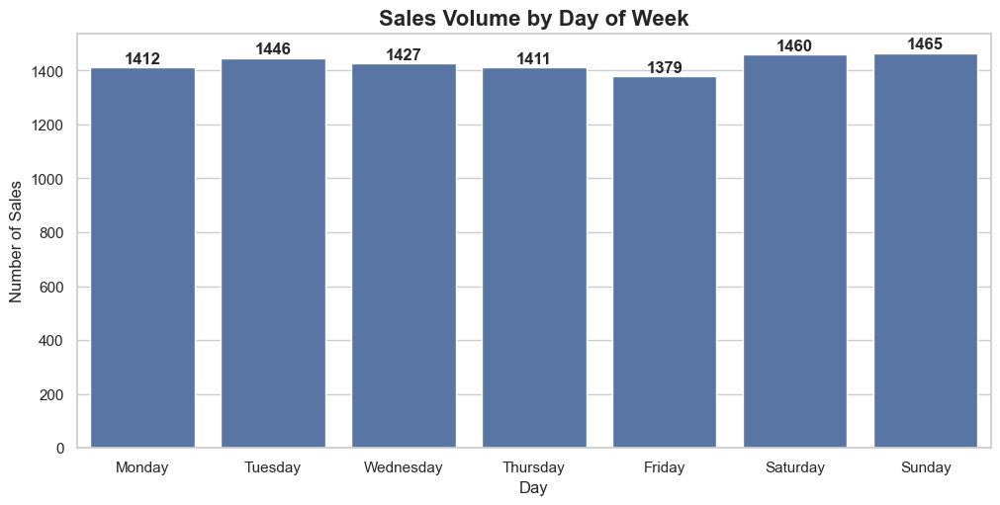

In [44]:
plt.figure(figsize=(10,5), constrained_layout=True)

sns.barplot(x=dow_sales.index,y=dow_sales.values)
plt.title('Sales Volume by Day of Week', fontsize=16, fontweight='bold')
plt.xlabel('Day')
plt.ylabel('Number of Sales')
offset = dow_sales.max() * 0.01
for i, v in enumerate(dow_sales.values):
    plt.text(i, v + offset, int(v), ha='center', fontweight='bold')

plt.show()


**Key insights (small & clear points):**

* **Weekend sales are highest**, with Sunday and Saturday leading.
* **Friday has the lowest sales volume**, indicating weaker demand.
* Sales **increase from Monday to Tuesday**, then gradually decline till Friday.
* Sharp **rebound in sales on Saturday**, showing strong weekend behavior.
* Demand pattern suggests customers prefer **weekend purchasing**.
* Opportunity to boost sales via **weekday promotions**, especially on Friday.
* Staffing and inventory should be **higher on weekends** to meet demand.


In [45]:
print("5. Cumulative Revenue Over Time")
data['Cum_Revenue'] = data['Revenue'].cumsum()
#print(data.head(5))

5. Cumulative Revenue Over Time


In [46]:
daily_cum = data.groupby('Sale_Date')['Cum_Revenue'].last().reset_index()
daily_cum

,Sale_Date,Cum_Revenue
0,2022-10-31,3.700367e+05
1,2022-11-01,8.593729e+05
2,2022-11-02,1.536391e+06
3,2022-11-03,2.705326e+06
4,2022-11-04,4.182604e+06
...,...,...
1090,2025-10-26,1.143637e+09
1091,2025-10-27,1.144152e+09
1092,2025-10-28,1.145111e+09
1093,2025-10-29,1.145915e+09


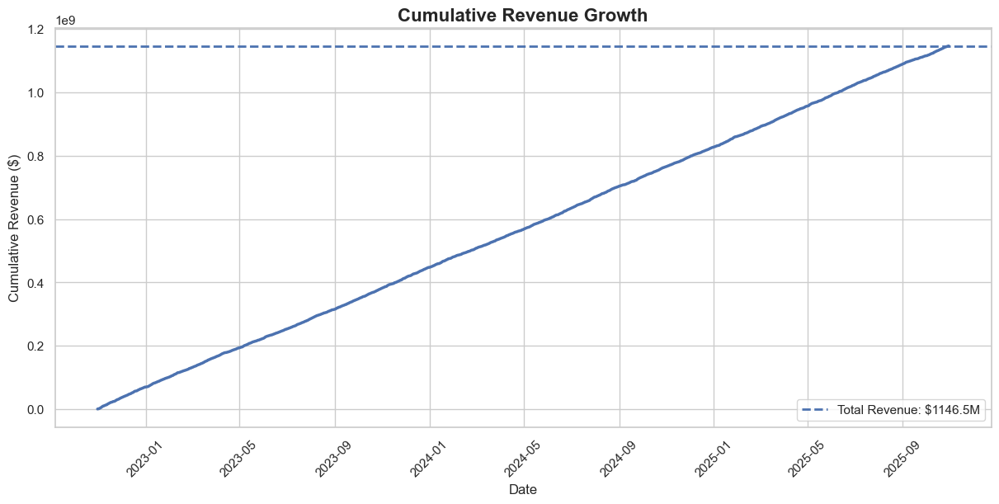

In [47]:
plt.figure(figsize=(12,6), constrained_layout=True)

plt.plot(daily_cum['Sale_Date'],
    daily_cum['Cum_Revenue'],linewidth=2.5)
plt.title('Cumulative Revenue Growth', fontsize=16, fontweight='bold')
plt.xlabel('Date')
plt.ylabel('Cumulative Revenue ($)')

final_revenue = daily_cum['Cum_Revenue'].iloc[-1]
plt.axhline(
    y=final_revenue,
    linestyle='--',
    linewidth=2,
    label=f"Total Revenue: ${final_revenue/1e6:.1f}M")
plt.legend()
plt.xticks(rotation=45)

plt.show()


> **Key insights (small & crisp points):**

* Cumulative revenue shows a **steady and consistent upward growth**.
* No visible plateaus, indicating **continuous sales inflow**.
* Growth slope is relatively uniform → **stable business performance**.
* Revenue crosses major milestones smoothly, suggesting **predictable earnings**.
* Total cumulative revenue reaches approximately **$1.15B or $1146.5M**.
* No sharp spikes or drops, implying **low revenue volatility(ups - downs)**.
* Business appears to be in a **healthy growth phase** with sustained momentum.


Average Discount % Trend


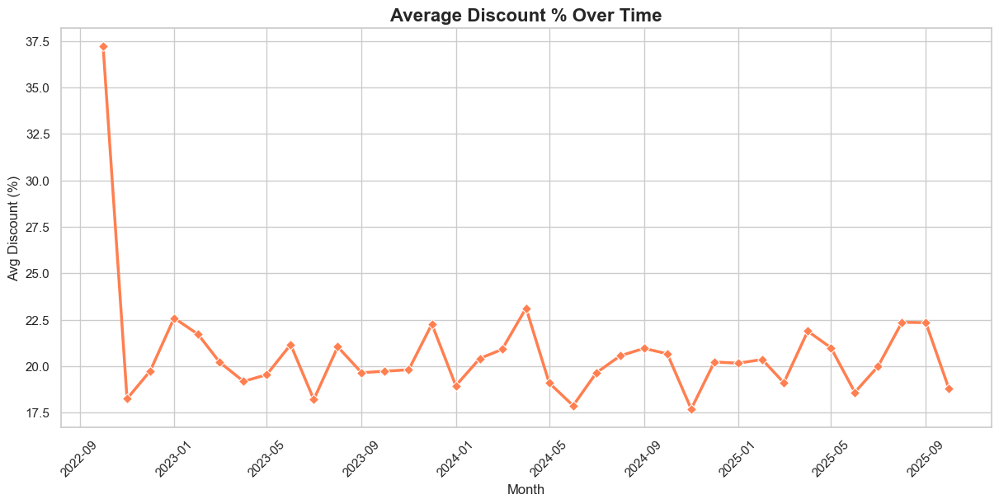

In [48]:
print("Average Discount % Trend")

data = data[data.Price > 0]
data['Discount_Pct'] = ((data['Price'] - data['Sale_Price']) / data['Price'] * 100).clip(lower=0)
monthly_disc = data.groupby('Month')['Discount_Pct'].mean().reset_index()
monthly_disc['Month'] = pd.to_datetime(monthly_disc['Month'])

plt.figure(figsize=(12, 6),constrained_layout = True)
sns.lineplot(data=monthly_disc, x='Month', y='Discount_Pct', marker='D', color='coral', linewidth=2.5)
plt.title('Average Discount % Over Time', fontweight='bold', fontsize=16)
plt.xlabel('Month')
plt.ylabel('Avg Discount (%)')
plt.xticks(rotation=45)

plt.show()

**Insights**

* **Initial Spike:** There is a very high average discount (~37.2%) around September 2022. This is an outlier compared to the rest of the period.
* **Stabilization:** After the initial spike, discounts stabilize around **18–23%** from late 2022 onwards.
* **Seasonal Peaks:** There are small peaks in discounts around **December 2022, December 2023, and April 2024**, indicating possible promotional periods or sales events.
* **Consistent Range:** Most months after stabilization stay roughly between **18% and 23%**, suggesting steady discounting strategy.
* **Recent Trend:** From 2025 onward, discounts slightly increase again, approaching the upper range (~22–23%).


Top 3 Brands: Monthly Sales Volume


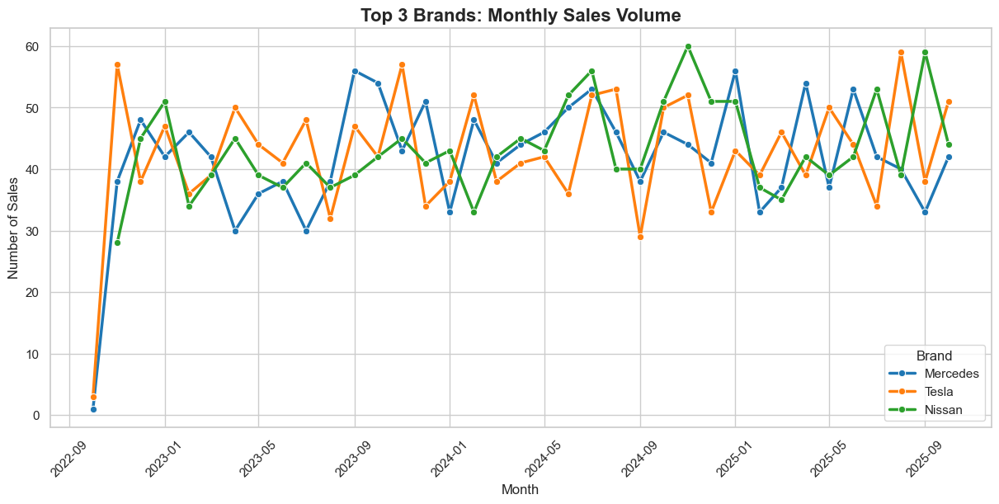

In [49]:
print("Top 3 Brands: Monthly Sales Volume")
top3_brands = data['Brand'].value_counts().head(3).index # top 3 brand

brand_monthly = data[data['Brand'].isin(top3_brands)].groupby(['Month','Brand']).size().reset_index(name='Count')
brand_monthly['Month'] = pd.to_datetime(brand_monthly['Month'])

plt.figure(figsize=(12, 6),constrained_layout = True)
sns.lineplot(data=brand_monthly, x='Month', y='Count', hue='Brand', marker='o', linewidth=2.5, palette='tab10')
plt.title('Top 3 Brands: Monthly Sales Volume', fontweight='bold', fontsize=16)
plt.xlabel('Month')
plt.ylabel('Number of Sales')
plt.legend(title='Brand')
plt.xticks(rotation=45)

plt.show()

**Key Insights:**

- All **three** brands show an overall upward trend in monthly sales from late **2022 to 2025**, despite some fluctuations.
- **Tesla and Nissan** frequently peak above 50 units in later months, indicating **stronger top-end monthly performance than Mercedes**.
- **Mercedes has more volatility**, with several sharp spikes and drops, suggesting its sales are less stable month to month.
- **Nissan’s sales line is relatively smoother** and often stays in the mid-to-high range, indicating consistent performance.
- Around mid‑2024, all three brands reach some of their highest volumes, showing a particularly strong sales period.



Car s age vs sales price Trend


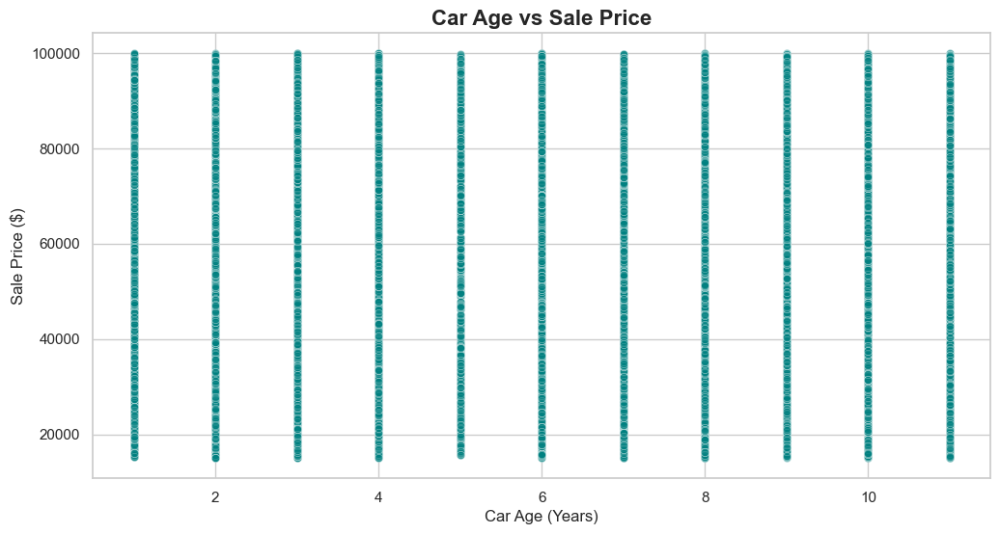

In [50]:
print('Car s age vs sales price Trend')
plt.figure(figsize=(12, 6))
sns.scatterplot(
    data=data,
    x="Car_Age",
    y="Sale_Price",
    color="teal",
    alpha=0.5)

plt.title("Car Age vs Sale Price", fontweight="bold", fontsize=16)
plt.xlabel("Car Age (Years)")
plt.ylabel("Sale Price ($)")
plt.show()


9. Top Salesperson: Monthly Revenue


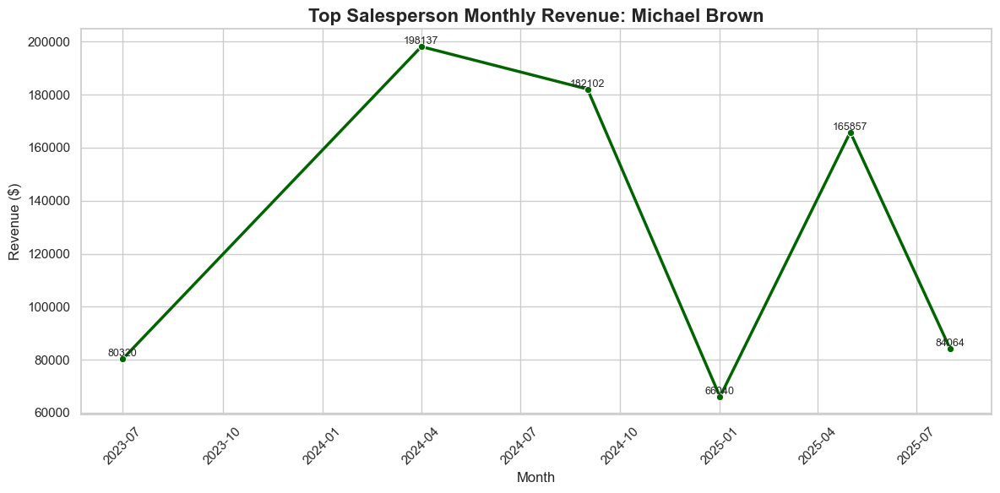

In [51]:
print("9. Top Salesperson: Monthly Revenue")
top_sp = data['Salesperson'].value_counts().idxmax() # get the hightest occuring sales person
sp_monthly = (
    data[data['Salesperson'] == top_sp].groupby('Month', as_index=False)['Revenue'].sum())
sp_monthly['Month'] = pd.to_datetime(sp_monthly['Month'])
sp_monthly = sp_monthly.sort_values('Month')

plt.figure(figsize=(12, 6))
sns.lineplot(data=sp_monthly, x='Month',y='Revenue',
    marker='o',color='darkgreen',linewidth=2.5)
plt.title(f'Top Salesperson Monthly Revenue: {top_sp}',fontweight='bold', fontsize=16)
plt.xlabel('Month')
plt.ylabel('Revenue ($)')
plt.xticks(rotation=45)
for i, row in sp_monthly.iterrows():
    plt.text(row['Month'], row['Revenue'],
           f"{row['Revenue']:.0f}",ha='center',
            va='bottom',fontsize=9)

plt.tight_layout()
plt.show()


In [52]:
# Payment Method share over time(Monthly):
print("Payment Method Share Trend")
pay_monthly = data.groupby(['Month','Payment_Method']).size().reset_index(name='Count')
pay_monthly['Month'] = pd.to_datetime(pay_monthly['Month'])

Payment Method Share Trend


In [53]:
#pay_monthly.pivot(index ='Month', columns='Payment_Method', values='Count').fillna(0)

In [54]:
pay_pivot = pay_monthly.pivot(index ='Month', columns='Payment_Method', values='Count').fillna(0)
pay_share = pay_pivot.div(pay_pivot.sum(axis=1), axis=0)

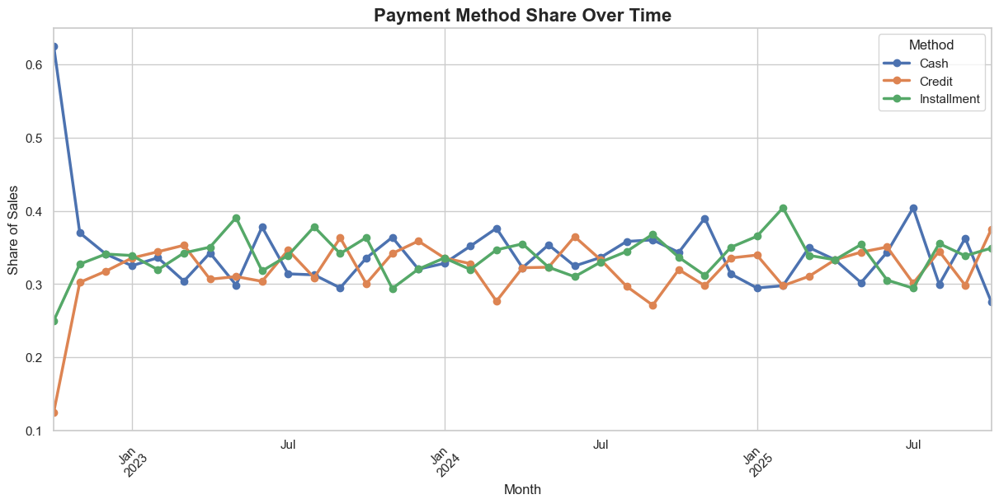

In [55]:
plt.figure(figsize=(12, 6),constrained_layout = True)
pay_share.plot(kind='line', marker='o', linewidth=2.5, ax=plt.gca())
plt.title('Payment Method Share Over Time', fontweight='bold', fontsize=16)
plt.xlabel('Month')
plt.ylabel('Share of Sales')
plt.legend(title='Method')
plt.xticks(rotation=45)

plt.show()

**Key Insights (Payment Method Share Over Time):**

- **Cash dominance declinedover the time:** Cash started very high initially (~60%) but quickly dropped and stabilized around **30–35%**, indicating reduced dependency over time.
  
* **Credit usage grew steadily:** Credit share increased from a low base and remained **consistently competitive (~30–35%)**, showing strong customer adoption.
* **Installment gained popularity:** Installment payments show a **gradual upward trend**, occasionally becoming the **top method**, especially in later months.
* **Balanced payment mix:** Over time, all three methods converge, reflecting a **diversified and stable payment strategy**.
* **No extreme volatility:** Month-on-month fluctuations are small, suggesting **consistent customer behavior** rather than sudden shifts.
* **Customer preference shift:** Clear movement from **Cash → Digital options (Credit & Installments)**, signaling digital payment maturity.



## Categorical Analysis: Bar Plots & Count Plots

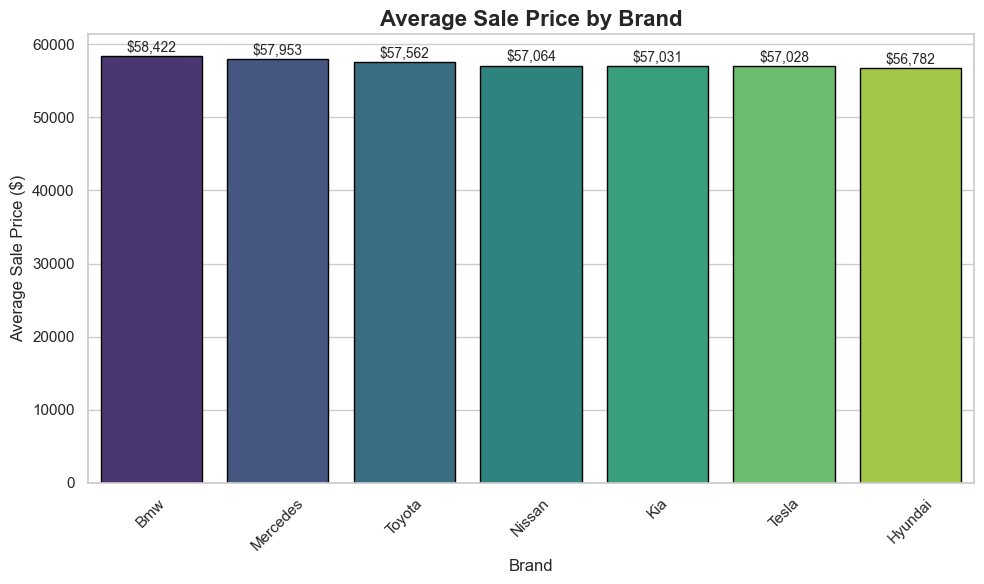

In [56]:
# Average Sale Price by Car Brand

brand_price = (data.groupby('Brand', as_index=False)['Sale_Price'].mean().sort_values('Sale_Price', ascending=False))

plt.figure(figsize=(10, 6))
sns.barplot(data=brand_price,x='Brand',y='Sale_Price',palette='viridis',edgecolor='black')

plt.title('Average Sale Price by Brand', fontsize=16, fontweight='bold')
plt.xlabel('Brand')
plt.ylabel('Average Sale Price ($)')
plt.xticks(rotation=45)

# Add value labels
offset = brand_price['Sale_Price'].max() * 0.01
for i, value in enumerate(brand_price['Sale_Price']):
    plt.text(i, value + offset, f"${value:,.0f}", ha='center', fontsize=10)

plt.tight_layout()
plt.show()


In [57]:
# Total Revenue by Engine Type

data['Revenue'] = data['Quantity'] * data['Sale_Price']
engine_revenue = data.groupby('Engine_Type')['Revenue'].sum().sort_values(ascending=False).reset_index()


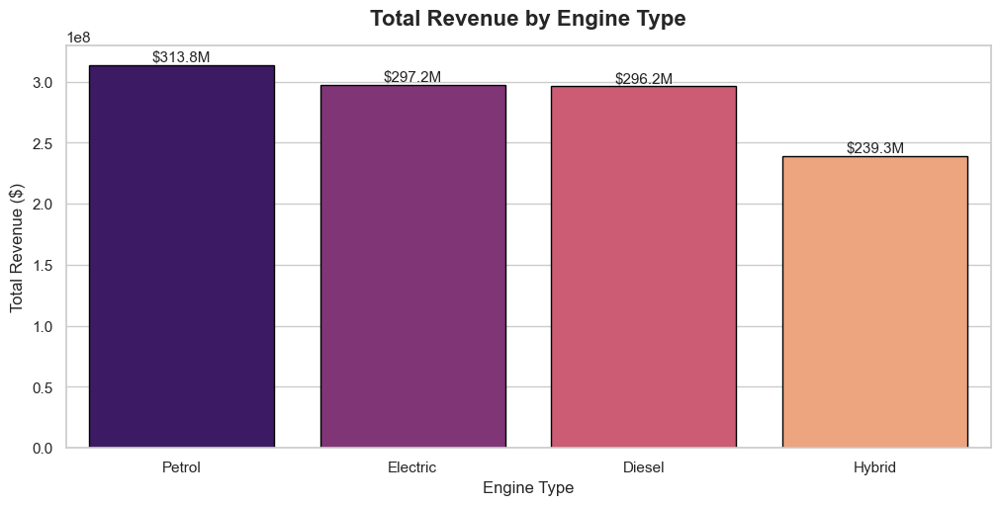

In [58]:
plt.figure(figsize=(10,5), constrained_layout = True)
sns.barplot(data = engine_revenue,x='Engine_Type',y='Revenue',palette='magma',edgecolor='black',)
plt.title('Total Revenue by Engine Type', fontsize=16, fontweight='bold', pad=15)
plt.xlabel('Engine Type')
plt.ylabel('Total Revenue ($)')

# Dynamic offset (1% of max revenue)
offset = engine_revenue['Revenue'].max() * 0.01
for i, value in enumerate(engine_revenue['Revenue']):
    plt.text(i, value + offset, f"${value/1e6:.1f}M", ha='center', fontsize=11)

#plt.tight_layout()
plt.show()

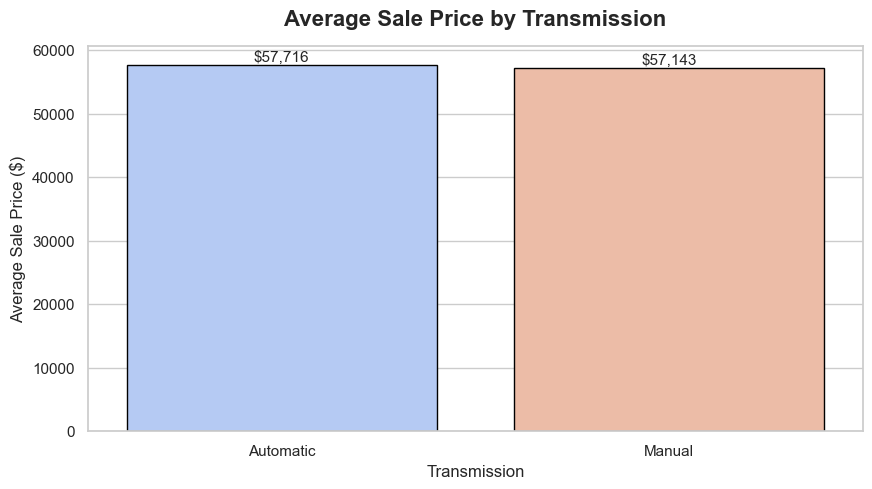

In [59]:
# Average sales by transmission:

trans_price = data.groupby('Transmission')['Sale_Price'].mean().sort_values(ascending = False).reset_index()


plt.figure(figsize=(10,5))
sns.barplot(data = trans_price,x='Transmission',y='Sale_Price',palette='coolwarm',edgecolor='black',)
plt.title('Average Sale Price by Transmission', fontsize=16, fontweight='bold', pad=15)
plt.xlabel('Transmission')
plt.ylabel('Average Sale Price ($)')

offset = trans_price['Sale_Price'].max() * 0.01
for i, value in enumerate(trans_price['Sale_Price']):
    plt.text(i, value + offset, f"${value:,.0f}", ha='center', fontsize=11)

#plt.tight_layout()
plt.show()


In [60]:
data.columns

Index(['Sale_ID', 'Customer_ID', 'Car_ID', 'Sale_Date', 'Quantity',
       'Sale_Price', 'Payment_Method', 'Salesperson', 'Brand', 'Model', 'Year',
       'Color', 'Engine_Type', 'Transmission', 'Price', 'Quantity_In_Stock',
       'Status', 'Name', 'Gender', 'Age', 'Phone', 'Email', 'City',
       'Sale_Month', 'Car_Age', 'Revenue', 'Month', 'Day_Of_Week',
       'Is_Weekend', 'Cum_Revenue', 'Discount_Pct'],
      dtype='object')

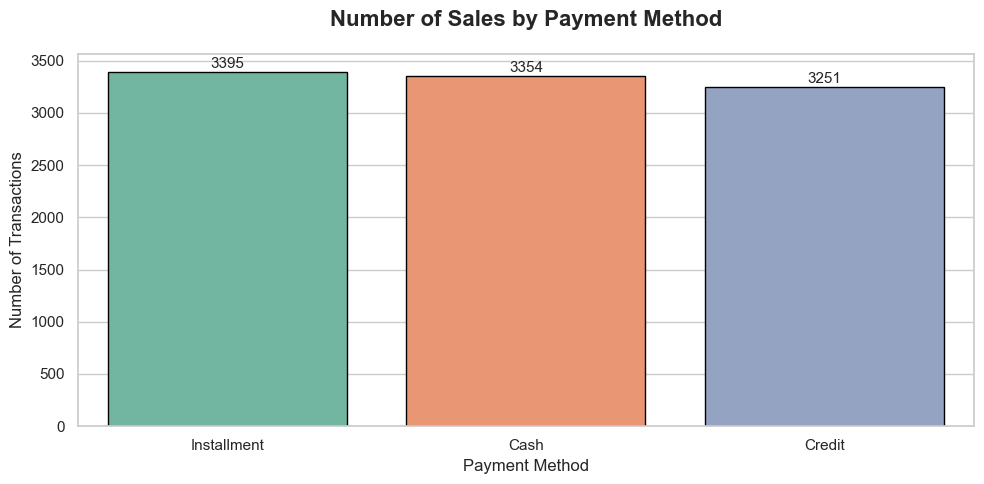

In [61]:
# Payment analysis
pay_count = data['Payment_Method'].value_counts()

plt.figure(figsize=(10,5))
sns.barplot(x=pay_count.index, y=pay_count.values, palette='Set2', edgecolor='black')
plt.title('Number of Sales by Payment Method', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Payment Method')
plt.ylabel('Number of Transactions')

offset = pay_count.values.max() * 0.01
for i, v in enumerate(pay_count.values):
    plt.text(i, v + offset, str(v), ha='center', fontsize=11)
plt.tight_layout()
plt.show()

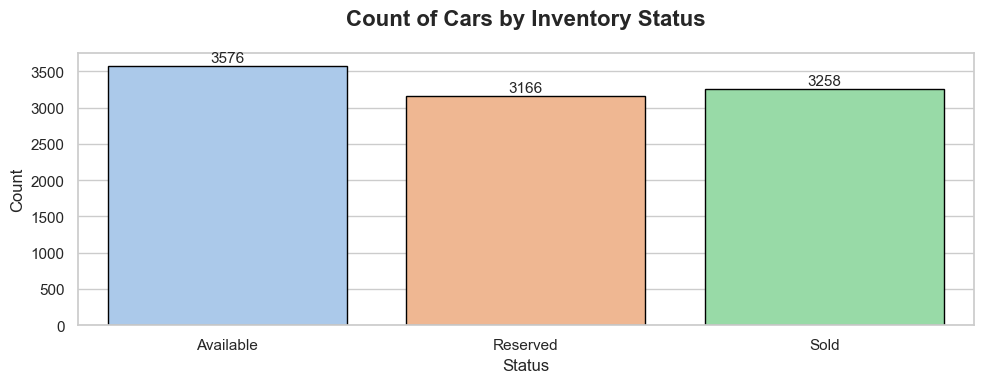

In [62]:
#Car Inventory Status

plt.figure(figsize= (10,4))
sns.countplot(data=data, x='Status', palette='pastel', edgecolor='black')
plt.title('Count of Cars by Inventory Status', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Status')
plt.ylabel('Count')
for p in plt.gca().patches:
    plt.gca().text(p.get_x() + p.get_width()/2, p.get_height() + 50, 
                   int(p.get_height()), ha='center', fontsize=11)
plt.tight_layout()
plt.show()

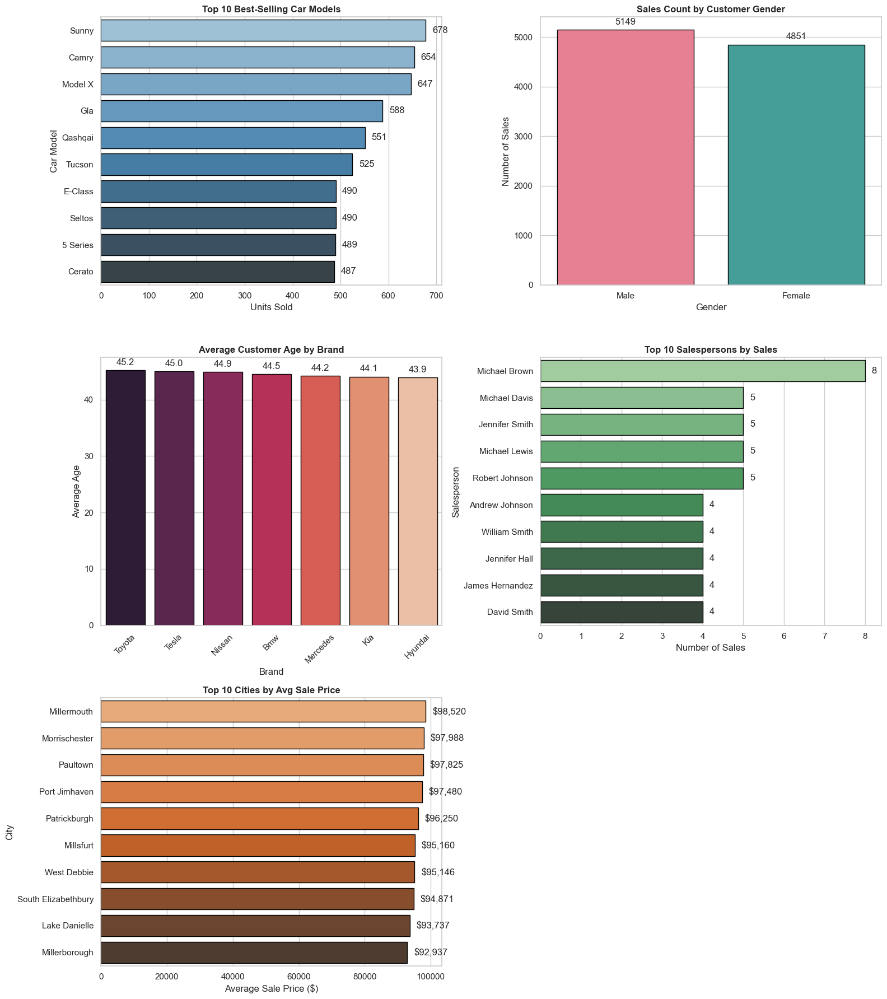

In [63]:
plt.figure(figsize=(16, 18))

plt.subplot(3,2,1)
#Top 10 Best-Selling Car Models

model_sales = data['Model'].value_counts().head(10)

sns.barplot(y=model_sales.index,x=model_sales.values, palette='Blues_d',edgecolor='black')
plt.title('Top 10 Best-Selling Car Models', fontweight='bold')
plt.xlabel('Units Sold')
plt.ylabel('Car Model')

offset = model_sales.max() * 0.02
for i, v in enumerate(model_sales.values):
    plt.text(v + offset, i, v, va='center')



# Sales Distribution by Customer Gender
plt.subplot(3, 2, 2)
sns.countplot(data=data,x='Gender',palette='husl',edgecolor='black')
plt.title('Sales Count by Customer Gender', fontweight='bold')
plt.xlabel('Gender')
plt.ylabel('Number of Sales')

offset = max(p.get_height() for p in plt.gca().patches) * 0.02
for p in plt.gca().patches:
    plt.text(
        p.get_x() + p.get_width()/2,
        p.get_height() + offset,
        int(p.get_height()),
        ha='center')

# Average Customer Age by Brand
plt.subplot(3, 2, 3)
brand_age = (data.groupby('Brand')['Age'].mean().sort_values(ascending=False))

sns.barplot(x=brand_age.index,y=brand_age.values,palette='rocket',edgecolor='black')
plt.title('Average Customer Age by Brand', fontweight='bold')
plt.xlabel('Brand')
plt.ylabel('Average Age')
plt.xticks(rotation=45)

offset = brand_age.max() * 0.02
for i, v in enumerate(brand_age.values):
    plt.text(i, v + offset, f"{v:.1f}", ha='center')


# Top 10 Salespersons by Number of Deals
plt.subplot(3, 2, 4)
salesperson_count = data['Salesperson'].value_counts().head(10)

sns.barplot(y=salesperson_count.index,x=salesperson_count.values,palette='Greens_d',edgecolor='black')
plt.title('Top 10 Salespersons by Sales', fontweight='bold')
plt.xlabel('Number of Sales')
plt.ylabel('Salesperson')

offset = salesperson_count.max() * 0.02
for i, v in enumerate(salesperson_count.values):
    plt.text(v + offset, i, v, va='center')

#Top 10 Cities by Average Sale Price
plt.subplot(3, 2, 5)
city_price = (data.groupby('City')['Sale_Price'].mean().nlargest(10))

sns.barplot(x=city_price.values,y=city_price.index,palette='Oranges_d',edgecolor='black')
plt.title('Top 10 Cities by Avg Sale Price', fontweight='bold')
plt.xlabel('Average Sale Price ($)')
plt.ylabel('City')

offset = city_price.max() * 0.02
for i, v in enumerate(city_price.values):
    plt.text(v + offset, i, f"${v:,.0f}", va='center')


# Hide empty subplot
plt.subplot(3, 2, 6)
plt.axis('off')

plt.tight_layout()
plt.show()




## Top 10 Best-Selling Car Models

* **Sunny** and **Camry** are the top-selling models, indicating strong mass-market demand.
* Sales volume across top models is **closely packed**, suggesting no single-model monopoly.
* Mix of **sedans and SUVs** shows diversified customer preferences.
* Consistent demand across brands implies effective portfolio balance.

---

## Sales Count by Customer Gender

* **Male customers slightly dominate** total purchases.
* **Female participation is strong**, representing a significant share of buyers.
* Indicates opportunity for **targeted marketing campaigns** toward female buyers.
* Overall gender distribution is fairly balanced.

---

## Average Customer Age by Brand

* **Toyota and Tesla buyers are the oldest**, indicating mature and financially stable customers.
* **Hyundai and Kia attract relatively younger buyers**, suggesting value-driven or first-time buyers.
* Luxury brands (**BMW, Mercedes**) sit in the middle, appealing to mid-to-senior professionals.
* Brand positioning aligns well with customer age demographics.

---

## Top 10 Salespersons by Sales

* **Michael Brown** clearly outperforms, acting as a top revenue driver.
* Several salespersons cluster around similar deal counts, indicating consistent team performance.
* Performance gap suggests scope for **best-practice knowledge sharing**.
* Opportunity to **replicate top-performer strategies** across the team.

---

## Top 10 Cities by Average Sale Price

* Cities like **Millermouth and Morrischester** command the highest average sale prices.
* Indicates presence of **premium customer segments** in these locations.
* Price variation across cities suggests **localized pricing power**.
* High-value cities are ideal targets for **luxury or high-margin models**.

## Feature Engineering;

In [64]:
data.Revenue

0        60976.18
1        48094.44
2        69533.19
3        15047.59
4        63493.84
          ...    
9995    249066.42
9996     86674.12
9997     91467.76
9998    114507.08
9999     67974.74
Name: Revenue, Length: 10000, dtype: float64

In [65]:
#car_age
from datetime import datetime
data['Car_Age'] = datetime.now().year - data['Year']
#data['Car_Age'] = pd.Timestamp().now().year - data['Year']
#data['Discount_Pct'] = ((data['Price'] - data['Sale_Price']) / data['Price'] * 100).clip(lower=0)
#data['Revenue'] = data['Quantity'] * data['Sale_Price']
data['Day_Of_Year'] = data['Sale_Date'].dt.dayofyear
data['Is_Weekend'] = data['Sale_Date'].dt.dayofweek.isin([5,6]).astype(int)
bins = [0,25,40,55,100]
labels = ['Gen Z (≤25)','Millennial (26-40)','Gen X (41-55)','Boomer+ (56+)']
data['Age_Group'] = pd.cut(data['Age'], bins=bins, labels=labels, include_lowest=True)

price_edges = [0, 30_000, 60_000, 100_000, data['Sale_Price'].max() + 1]
price_edges = sorted(set(price_edges))          # ← guarantees monotonic increase
price_labels = ['Budget (<$30K)','Mid ($30K-$60K)','Premium ($60K-$100K)','Luxury (>$100K)']
data['Price_Tier'] = pd.cut(data['Sale_Price'],bins=price_edges, labels =price_labels,include_lowest=True)

# Brand_Prestige (rank)
brand_avg = data.groupby('Brand')['Sale_Price'].mean().sort_values(ascending=False)
data['Brand_Prestige'] = data['Brand'].map(brand_avg).rank(ascending=False).astype(int)

# Salesperson_Score (rank)
sp_avg = data.groupby('Salesperson')['Revenue'].mean().sort_values(ascending=False)
data['Salesperson_Score'] = data['Salesperson'].map(sp_avg).rank(ascending=False).astype(int)

# High-Value Customer
cust_spend = data.groupby('Customer_ID')['Revenue'].sum()
data['Total_Spend'] = data['Customer_ID'].map(cust_spend)
data['Is_High_Value'] = (data['Total_Spend'] > 150_000).astype(int)
hv_pct = data['Is_High_Value'].mean()*100

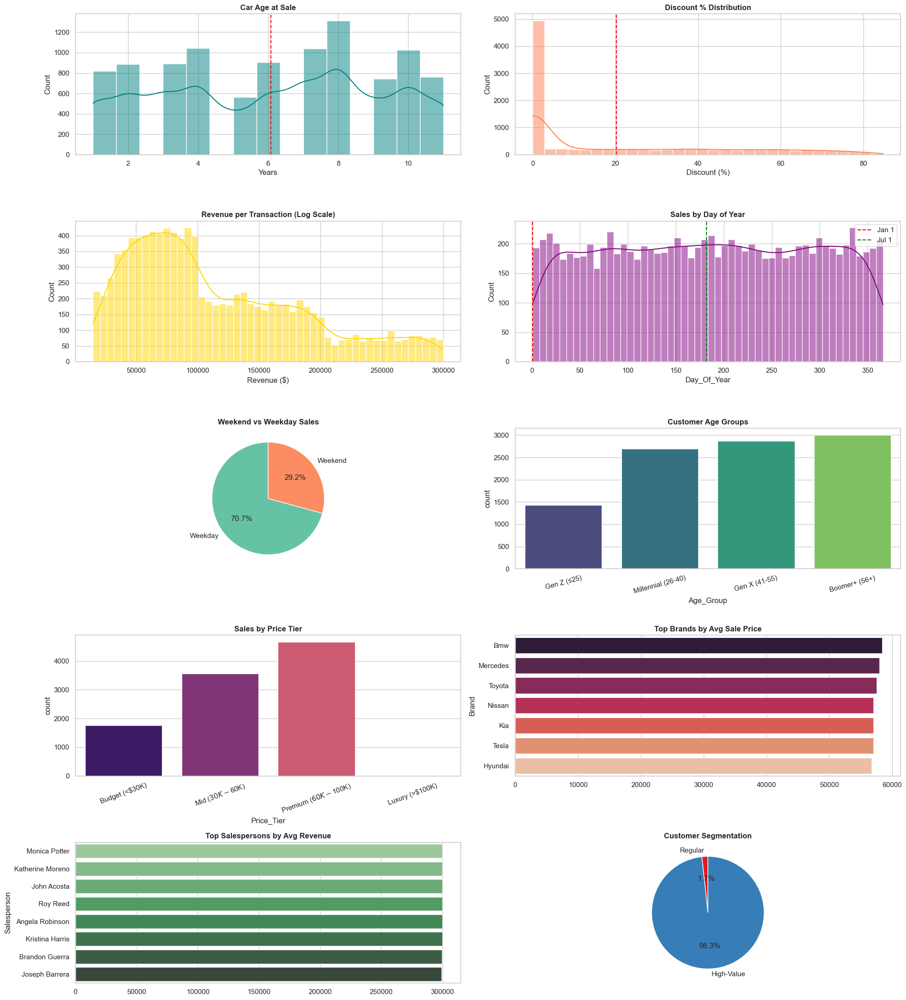

In [66]:
plt.figure(figsize=(20, 22))

# -------------------------------------------------
# 1. Car Age Distribution
plt.subplot(5, 2, 1)
sns.histplot(data['Car_Age'], kde=True, bins=15, color='teal')
plt.axvline(data['Car_Age'].mean(), color='red', ls='--')
plt.title('Car Age at Sale', fontweight='bold')
plt.xlabel('Years'); plt.ylabel('Count')

# -------------------------------------------------
# 2. Discount % Distribution
plt.subplot(5, 2, 2)
sns.histplot(data['Discount_Pct'], kde=True, bins=30, color='coral')
plt.axvline(data['Discount_Pct'].mean(), color='red', ls='--')
plt.title('Discount % Distribution', fontweight='bold')
plt.xlabel('Discount (%)'); plt.ylabel('Count')

# -------------------------------------------------
# 3. Revenue Distribution (Log Scale)
plt.subplot(5, 2, 3)
sns.histplot(data['Revenue'], bins=50, color='gold', kde = True)
plt.title('Revenue per Transaction (Log Scale)', fontweight='bold')
plt.xlabel('Revenue ($)'); plt.ylabel('Count')

# -------------------------------------------------
# 4. Sales by Day of Year
plt.subplot(5, 2, 4)
sns.histplot(data['Day_Of_Year'], bins=52, kde=True, color='purple')
plt.axvline(1, color='red', ls='--', label='Jan 1')
plt.axvline(182, color='green', ls='--', label='Jul 1')
plt.title('Sales by Day of Year', fontweight='bold')
plt.legend()

# -------------------------------------------------
# 5. Weekend vs Weekday Sales
wknd_pct = data['Is_Weekend'].mean() * 100
days = [100 - wknd_pct, wknd_pct]
labels_days = ['Weekday', 'Weekend']
colors_days = sns.color_palette("Set2", 2)  # Use first 2 colors from Set2

plt.subplot(5, 2, 5)
plt.pie(days, labels=labels_days, autopct='%1.1f%%', colors=colors_days, startangle=90)
plt.title('Weekend vs Weekday Sales', fontweight='bold')

# -------------------------------------------------
# 6. Customer Age Groups
plt.subplot(5, 2, 6 )
#labels = ['Gen Z (≤25)','Millennial (26-40)','Gen X (41-55)','Boomer+ (56+)']
sns.countplot(data=data, x='Age_Group', order = labels, palette='viridis')
plt.title('Customer Age Groups', fontweight='bold')
plt.xticks(rotation=15)

# -------------------------------------------------
# 7. Sales by Price Tier
plt.subplot(5, 2, 7)
sns.countplot(data=data, x='Price_Tier', palette='magma')
plt.title('Sales by Price Tier', fontweight='bold')
plt.xticks(rotation=20)

# -------------------------------------------------
# 8. Top Brands by Avg Sale Price
plt.subplot(5, 2, 8)
sns.barplot(x=brand_avg.head(8).values, y=brand_avg.head(8).index, palette='rocket')
plt.title('Top Brands by Avg Sale Price', fontweight='bold')

# -------------------------------------------------
# 9. Top Salespersons by Avg Revenue
plt.subplot(5, 2, 9)
sns.barplot(x = sp_avg.head(8).values, y = sp_avg.head(8).index, palette='Greens_d')
plt.title('Top Salespersons by Avg Revenue', fontweight='bold')

# -------------------------------------------------
# 10. High-Value Customers
plt.subplot(5, 2, 10)
hv_pct = data['Is_High_Value'].mean() * 100
segments = [100 - hv_pct, hv_pct]
labels_segments = ['Regular', 'High-Value']
colors_segments = sns.color_palette("Set1", 2)  # Use first 2 colors from Set1

plt.pie(segments, labels=labels_segments, autopct='%1.1f%%', colors=colors_segments, startangle=90)
plt.title('Customer Segmentation', fontweight='bold')


plt.tight_layout()
plt.show()



1. **Car Age at Sale**

   * Most cars sold are between **4–7 years old**.
   * There’s a slight drop for very new (<2 years) and very old (>8 years) cars.

2. **Discount % Distribution**

   * Majority of transactions have **low discounts (~0–20%)**.
   * Very few sales have high discounts (>40%), suggesting selective promotions.

3. **Revenue per Transaction (Log Scale)**

   * Most transactions are concentrated around **$50k–$100k**.
   * There’s a long tail of **high-value transactions up to ~$300k**.

4. **Sales by Day of Year**

   * Sales are **relatively stable throughout the year**.
   * Peaks around **mid-year** and **year start**, likely seasonal effects.

5. **Weekend vs Weekday Sales**

   * Majority of sales occur on **weekdays (~70%)**, weekends contribute ~30%.

6. **Customer Age Groups**

   * Most buyers are **Gen X (41–55) and Boomers (56+)**.
   * Fewer sales to **Gen Z (<25)**.

7. **Sales by Price Tier**

   * **Premium ($60k–100k)** segment dominates.
   * Budget and mid-tier are smaller portions; luxury sales are limited.

8. **Top Brands by Avg Sale Price**

   * **BMW, Mercedes, Toyota** are top brands by average sale price.
   * Hyundai, Kia, and Tesla are on the lower end.

9. **Top Salespersons by Avg Revenue**

   * Top 8 salespersons generate **similar high revenues (~$250k–$300k)**.
   * Performance is fairly uniform among top performers.

10. **Customer Segmentation**

    * Vast majority of customers are **High-Value (~98%)**.
    * Only a tiny fraction are regular customers (~2%).


## HeatMap:

In [67]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10000 entries, 0 to 9999
Data columns (total 38 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   Sale_ID            10000 non-null  object        
 1   Customer_ID        10000 non-null  object        
 2   Car_ID             10000 non-null  object        
 3   Sale_Date          10000 non-null  datetime64[ns]
 4   Quantity           10000 non-null  int64         
 5   Sale_Price         10000 non-null  float64       
 6   Payment_Method     10000 non-null  object        
 7   Salesperson        10000 non-null  object        
 8   Brand              10000 non-null  object        
 9   Model              10000 non-null  object        
 10  Year               10000 non-null  int32         
 11  Color              10000 non-null  object        
 12  Engine_Type        10000 non-null  object        
 13  Transmission       10000 non-null  object        
 14  Price  

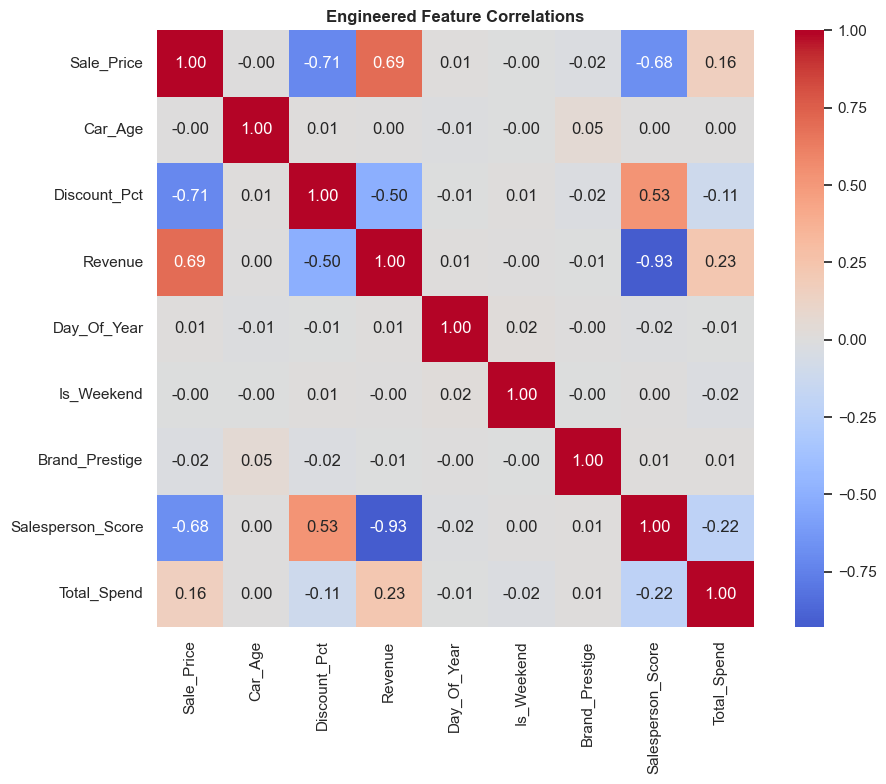

In [68]:
feat_cols = ['Sale_Price','Car_Age','Discount_Pct','Revenue',
             'Day_Of_Year',
             'Is_Weekend',
             'Brand_Prestige',
             'Salesperson_Score',
             'Total_Spend']
corr = data[feat_cols].corr()

plt.figure(figsize=(10,8))
sns.heatmap(corr, annot=True, cmap='coolwarm', center=0, fmt='.2f', square=True)
plt.title('Engineered Feature Correlations', fontweight='bold')
plt.tight_layout() 
plt.show()

## Pairplot:

In [69]:
num_data = data.select_dtypes('number').columns
print(num_data)
cat_data = data.select_dtypes('object').columns
print(cat_data)

Index(['Quantity', 'Sale_Price', 'Year', 'Price', 'Quantity_In_Stock', 'Age',
       'Car_Age', 'Revenue', 'Is_Weekend', 'Cum_Revenue', 'Discount_Pct',
       'Day_Of_Year', 'Brand_Prestige', 'Salesperson_Score', 'Total_Spend',
       'Is_High_Value'],
      dtype='object')
Index(['Sale_ID', 'Customer_ID', 'Car_ID', 'Payment_Method', 'Salesperson',
       'Brand', 'Model', 'Color', 'Engine_Type', 'Transmission', 'Status',
       'Name', 'Gender', 'Phone', 'Email', 'City', 'Sale_Month', 'Month',
       'Day_Of_Week'],
      dtype='object')


In [70]:
pairplot_col = num_data.union(cat_data)

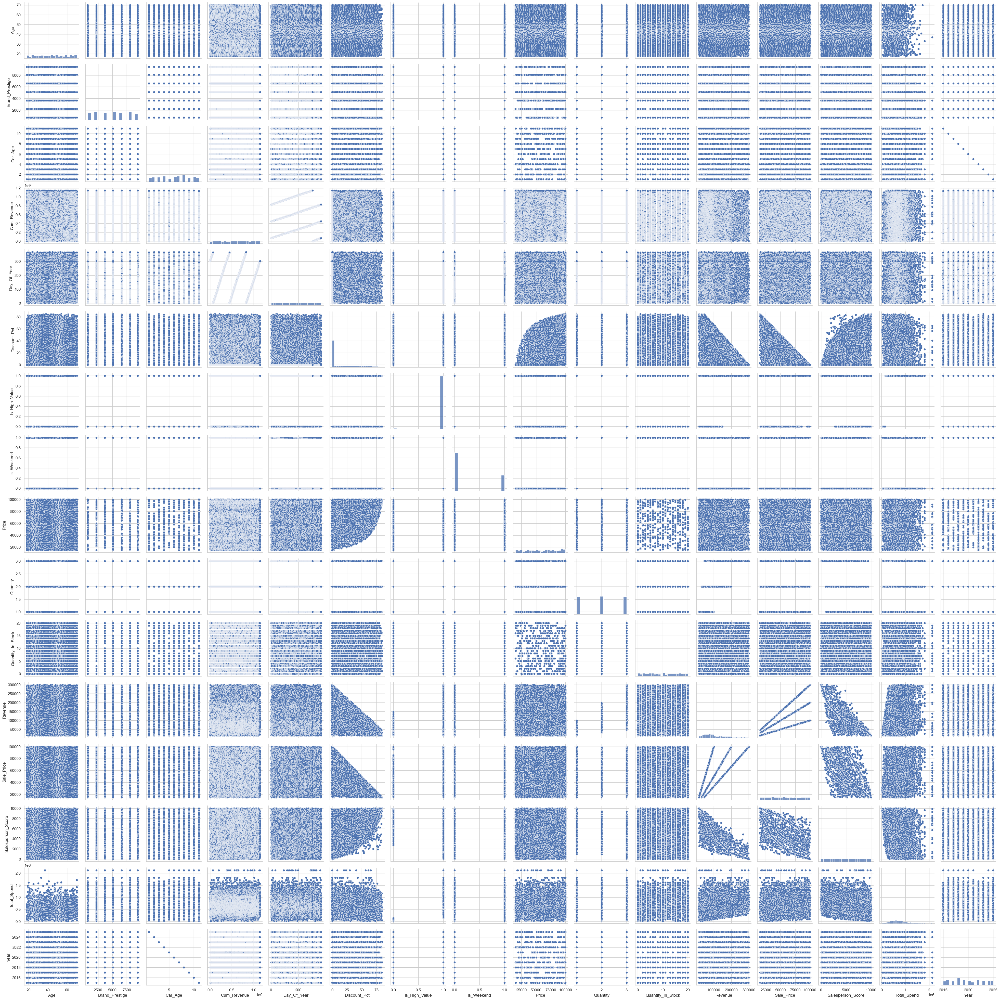

In [71]:
sns.pairplot(data = data[pairplot_col])
plt.show()

## Density distrubution & multimodality

In [72]:
data.Salesperson.value_counts().head(10)

Salesperson
Michael Brown      8
Michael Davis      5
Jennifer Smith     5
Michael Lewis      5
Robert Johnson     5
Andrew Johnson     4
William Smith      4
Jennifer Hall      4
James Hernandez    4
David Smith        4
Name: count, dtype: int64

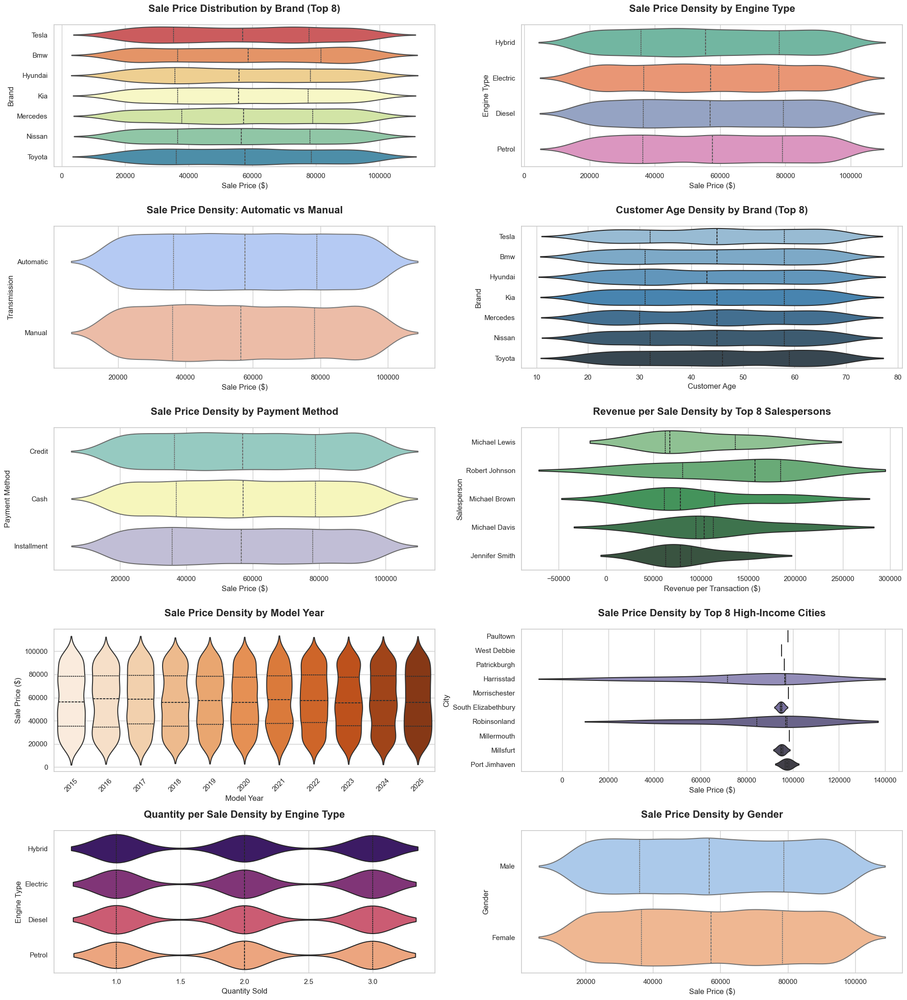

In [73]:
plt.figure(figsize=(20, 22))

# -------------------------------------------------
# 1. Sale Price Density by Brand 
top_brands = data['Brand'].value_counts().index
data_brand = data[data['Brand'].isin(top_brands)]
plt.subplot(5, 2, 1)
sns.violinplot(data=data_brand, x='Sale_Price', y='Brand', palette='Spectral', inner='quartile', linewidth=1.5)
plt.title('Sale Price Distribution by Brand (Top 8)', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Sale Price ($)')
plt.ylabel('Brand')

# -------------------------------------------------
# 2. Sale Price Density by Engine Type
plt.subplot(5, 2, 2)
sns.violinplot(data=data, x='Sale_Price', y='Engine_Type', palette='Set2', inner='quartile', linewidth=1.5)
plt.title('Sale Price Density by Engine Type', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Sale Price ($)')
plt.ylabel('Engine Type')
# -------------------------------------------------
# 3. Sale Price by Transmission(automatic vs mannual)
plt.subplot(5, 2, 3)
sns.violinplot(data= data, x='Sale_Price', y='Transmission', palette='coolwarm', inner='quartile', linewidth=1.5)
plt.title('Sale Price Density: Automatic vs Manual', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Sale Price ($)')
plt.ylabel('Transmission')

# -------------------------------------------------
# 4. Customer Age Density by Brand
plt.subplot(5, 2, 4)
sns.violinplot(data = data_brand, x = 'Age', y='Brand', palette='Blues_d', inner='quartile', linewidth=1.5)
plt.title('Customer Age Density by Brand (Top 8)', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Customer Age')
plt.ylabel('Brand')


# -------------------------------------------------
# 5.Sale Price by Payment Method

plt.subplot(5, 2, 5)
sns.violinplot(data=data, x='Sale_Price', y='Payment_Method', palette='Set3', inner='quartile', linewidth=1.5)
plt.title('Sale Price Density by Payment Method', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Sale Price ($)')
plt.ylabel('Payment Method')

# -------------------------------------------------
# 6. Revenue per Transaction by Salesperson 
top5_sp = data['Salesperson'].value_counts().head().index
data_sp = data[data['Salesperson'].isin(top5_sp)]

plt.subplot(5, 2, 6 )
sns.violinplot(data = data_sp, x='Revenue', y='Salesperson', palette='Greens_d', inner='quartile', linewidth=1.5)
plt.title('Revenue per Sale Density by Top 8 Salespersons', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Revenue per Transaction ($)')
plt.ylabel('Salesperson')

# -------------------------------------------------
# 7. Sale Price by Model Year
plt.subplot(5, 2, 7)
sns.violinplot(data = data, x='Year', 
               y='Sale_Price', palette='Oranges', inner='quartile', linewidth=1.5)
plt.title('Sale Price Density by Model Year', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Model Year')
plt.ylabel('Sale Price ($)')
plt.xticks(rotation=45)

# -------------------------------------------------
# 8. Sale Price by City (Top 8 Highest Median)
top_cities = data.groupby('City')['Sale_Price'].median().nlargest(10).index
data_city = data[data['City'].isin(top_cities)]

plt.subplot(5, 2, 8)
sns.violinplot(data=data_city, x='Sale_Price', y='City', 
               palette='Purples_d', inner='quartile', linewidth=1.5)
plt.title('Sale Price Density by Top 8 High-Income Cities', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Sale Price ($)')
plt.ylabel('City')

# -------------------------------------------------
# 9. Quantity per Transaction by Engine Type
plt.subplot(5, 2, 9)
sns.violinplot(data = data, x='Quantity', y='Engine_Type', 
               palette='magma', inner='quartile', linewidth=1.5)
plt.title('Quantity per Sale Density by Engine Type', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Quantity Sold')
plt.ylabel('Engine Type')
# -------------------------------------------------
# 10. Sales Price by Gender
plt.subplot(5, 2, 10)
sns.violinplot(data = data, x='Sale_Price', y='Gender', palette='pastel', inner='quartile', linewidth=1.5)
plt.title('Sale Price Density by Gender', fontsize=16, fontweight='bold', pad=20)
plt.xlabel('Sale Price ($)')
plt.ylabel('Gender')

plt.tight_layout()
plt.show()

In [74]:
data.groupby('City')['Sale_Price'].median().nlargest(10).index

Index(['Millermouth', 'Morrischester', 'Paultown', 'Port Jimhaven',
       'Robinsonland', 'Harrisstad', 'Patrickburgh', 'Millsfurt',
       'West Debbie', 'South Elizabethbury'],
      dtype='object', name='City')

## ML & Feature-Importance

In [75]:
import pandas as pd, numpy as np
import matplotlib.pyplot as plt       
import seaborn as sns
from pathlib import Path
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.svm import SVR
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
# import shap, warnings
# warnings.filterwarnings('ignore')

In [76]:
data.columns

Index(['Sale_ID', 'Customer_ID', 'Car_ID', 'Sale_Date', 'Quantity',
       'Sale_Price', 'Payment_Method', 'Salesperson', 'Brand', 'Model', 'Year',
       'Color', 'Engine_Type', 'Transmission', 'Price', 'Quantity_In_Stock',
       'Status', 'Name', 'Gender', 'Age', 'Phone', 'Email', 'City',
       'Sale_Month', 'Car_Age', 'Revenue', 'Month', 'Day_Of_Week',
       'Is_Weekend', 'Cum_Revenue', 'Discount_Pct', 'Day_Of_Year', 'Age_Group',
       'Price_Tier', 'Brand_Prestige', 'Salesperson_Score', 'Total_Spend',
       'Is_High_Value'],
      dtype='object')

In [77]:
data.head().T

,0,1,2,3,4
Sale_ID,S07784,S02199,S03688,S02901,S01216
Customer_ID,CU1432,CU1297,CU0692,CU0573,CU0634
Car_ID,C0266,C0440,C0452,C0329,C0348
Sale_Date,2022-10-31 00:00:00,2022-10-31 00:00:00,2022-10-31 00:00:00,2022-10-31 00:00:00,2022-10-31 00:00:00
Quantity,1,1,1,1,2
Sale_Price,60976.18,48094.44,69533.19,15047.59,31746.92
Payment_Method,Credit,Cash,Installment,Cash,Cash
Salesperson,Andre Burgess,Denise Washington,Blake Mcdaniel,Patrick Barrett,Joseph Pratt
Brand,Tesla,Tesla,Bmw,Tesla,Hyundai
Model,Model X,Model 3,X5,Model S,Tucson


In [78]:
# target = 'Sale_Price'
# feat_cols = ['Price','Year','Car_Age','Quantity','Age','Discount_Pct', 'Day_Of_Year','Is_Weekend',
#              'Brand_Prestige','Salesperson_Score',
#              'Engine_Type','Transmission','Payment_Method','Gender','Brand']

# X = data[feat_cols].copy()
# y = data[target].copy()



In [79]:
target = 'Sale_Price'

num_cols = ['Price','Year','Car_Age','Quantity','Age','Discount_Pct',
    'Day_Of_Year','Is_Weekend','Brand_Prestige','Salesperson_Score']

cat_cols = ['Engine_Type','Transmission','Payment_Method','Gender','Brand']

X = data[num_cols + cat_cols]
y = data[target]

In [80]:
# Train–Test Split:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [81]:
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

X_train shape: (8000, 15)
y_train shape: (8000,)
X_test shape: (2000, 15)
y_test shape: (2000,)


In [82]:
X_train.head()

,Price,Year,Car_Age,Quantity,Age,Discount_Pct,Day_Of_Year,Is_Weekend,Brand_Prestige,Salesperson_Score,Engine_Type,Transmission,Payment_Method,Gender,Brand
9254,35856.76,2017,9,3,20,0.000000,219,0,8080,902,Diesel,Manual,Credit,Female,Tesla
1561,40162.15,2022,4,1,70,0.000000,109,0,2203,5458,Petrol,Automatic,Cash,Female,Mercedes
1670,76450.54,2023,3,3,23,0.000000,122,0,3659,692,Electric,Automatic,Installment,Female,Toyota
6087,58245.71,2022,4,2,30,0.000000,243,0,9434,3063,Electric,Automatic,Cash,Female,Hyundai
6669,87083.91,2024,2,2,48,39.417936,307,1,8080,4443,Hybrid,Manual,Credit,Female,Tesla


In [83]:
# ColumnTransformer:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder

preprocess = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), num_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore', drop='first'), cat_cols)
    ]
) # use ohe instead of label encoder, to avoid fake ordering

In [84]:
preprocess

ColumnTransformer(transformers=[('num', StandardScaler(),
                                 ['Price', 'Year', 'Car_Age', 'Quantity', 'Age',
                                  'Discount_Pct', 'Day_Of_Year', 'Is_Weekend',
                                  'Brand_Prestige', 'Salesperson_Score']),
                                ('cat',
                                 OneHotEncoder(drop='first',
                                               handle_unknown='ignore'),
                                 ['Engine_Type', 'Transmission',
                                  'Payment_Method', 'Gender', 'Brand'])])

In [85]:
from sklearn.pipeline import Pipeline

pipelines = {
    'Linear': Pipeline([
        ('prep', preprocess),
        ('model', LinearRegression())
    ]),

    'Ridge': Pipeline([
        ('prep', preprocess),
        ('model', Ridge(alpha=1.0))
    ]),

    'Lasso': Pipeline([
        ('prep', preprocess),
        ('model', Lasso(alpha=0.1))
    ]),

    'SVR': Pipeline([
        ('prep', preprocess),
        ('model', SVR(kernel='rbf', C=100, gamma=0.1))
    ]),

    'RF': Pipeline([
        ('prep', preprocess),
        ('model', RandomForestRegressor(n_estimators=100, random_state=42))
    ]),

    'GB': Pipeline([
        ('prep', preprocess),
        ('model', GradientBoostingRegressor(n_estimators=100, random_state=42))
    ])
}

In [86]:
pipelines

{'Linear': Pipeline(steps=[('prep',
                  ColumnTransformer(transformers=[('num', StandardScaler(),
                                                   ['Price', 'Year', 'Car_Age',
                                                    'Quantity', 'Age',
                                                    'Discount_Pct',
                                                    'Day_Of_Year', 'Is_Weekend',
                                                    'Brand_Prestige',
                                                    'Salesperson_Score']),
                                                  ('cat',
                                                   OneHotEncoder(drop='first',
                                                                 handle_unknown='ignore'),
                                                   ['Engine_Type',
                                                    'Transmission',
                                                    'Payment_Method', 'Gender',


In [87]:
for name, pipe in pipelines.items():
    #print(name)
    print(pipe)

Pipeline(steps=[('prep',
                 ColumnTransformer(transformers=[('num', StandardScaler(),
                                                  ['Price', 'Year', 'Car_Age',
                                                   'Quantity', 'Age',
                                                   'Discount_Pct',
                                                   'Day_Of_Year', 'Is_Weekend',
                                                   'Brand_Prestige',
                                                   'Salesperson_Score']),
                                                 ('cat',
                                                  OneHotEncoder(drop='first',
                                                                handle_unknown='ignore'),
                                                  ['Engine_Type',
                                                   'Transmission',
                                                   'Payment_Method', 'Gender',
                        

In [88]:
# Train & Evaluate (Clean & Fast)
results = []

for name, pipe in pipelines.items():
    print(f"Training {name}...")

    pipe.fit(X_train, y_train)
    preds = pipe.predict(X_test)

    results.append({
        'Model': name,
        'MAE': mean_absolute_error(y_test, preds),
        'RMSE': np.sqrt(mean_squared_error(y_test, preds)),
        'R2': r2_score(y_test, preds)
    })

results_df = pd.DataFrame(results).sort_values('RMSE')
print(results_df)


Training Linear...
Training Ridge...
Training Lasso...
Training SVR...
Training RF...
Training GB...
    Model           MAE          RMSE        R2
5      GB   3615.935888   6338.059177  0.934851
4      RF   2336.290148   6399.780122  0.933576
2   Lasso   7336.016160   9616.549117  0.850021
1   Ridge   7336.476649   9616.724627  0.850015
0  Linear   7333.065240   9617.386541  0.849995
3     SVR  13153.270784  15958.829979  0.586957


In [89]:
df_res = results_df.sort_values('R2',ascending= False)
df_res

,Model,MAE,RMSE,R2
5,GB,3615.935888,6338.059177,0.934851
4,RF,2336.290148,6399.780122,0.933576
2,Lasso,7336.016160,9616.549117,0.850021
1,Ridge,7336.476649,9616.724627,0.850015
0,Linear,7333.065240,9617.386541,0.849995
3,SVR,13153.270784,15958.829979,0.586957


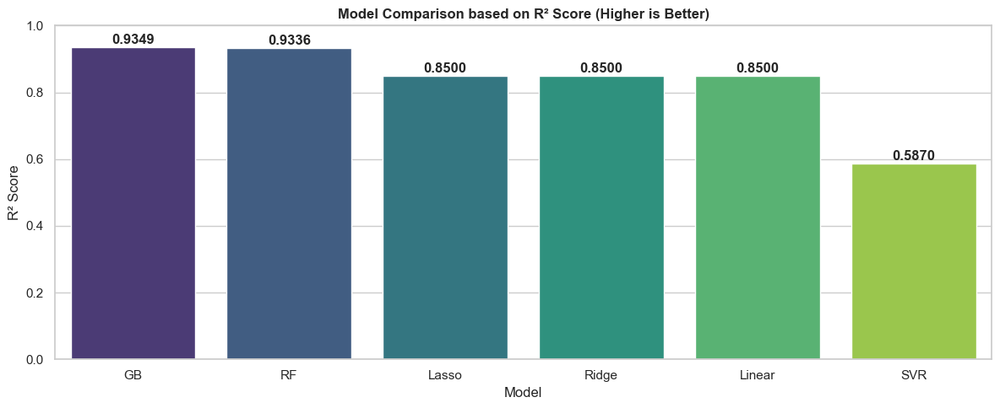

In [90]:
# plot R² comparison
plt.figure(figsize=(12, 5))
sns.barplot(x=df_res.Model, y=df_res['R2'], palette='viridis')

plt.title('Model Comparison based on R² Score (Higher is Better)', fontweight='bold')
plt.xlabel('Model')
plt.ylabel('R² Score')
for i, v in enumerate(df_res['R2']):
    plt.text(i, v + 0.01, f"{v:.4f}", ha='center', fontweight='bold')

plt.ylim(0, 1)
plt.tight_layout()
plt.show()

plt.show()

In [91]:
df_res

,Model,MAE,RMSE,R2
5,GB,3615.935888,6338.059177,0.934851
4,RF,2336.290148,6399.780122,0.933576
2,Lasso,7336.016160,9616.549117,0.850021
1,Ridge,7336.476649,9616.724627,0.850015
0,Linear,7333.065240,9617.386541,0.849995
3,SVR,13153.270784,15958.829979,0.586957


In [92]:
df_res.iloc[0]

Model             GB
MAE      3615.935888
RMSE     6338.059177
R2          0.934851
Name: 5, dtype: object

In [93]:
best_model_name = df_res.iloc[0]['Model']
best_r2 = df_res.iloc[0]['R2']

print(f"Best Model: {best_model_name}")
print(f"Best R² Score: {best_r2:.4f}")


Best Model: GB
Best R² Score: 0.9349


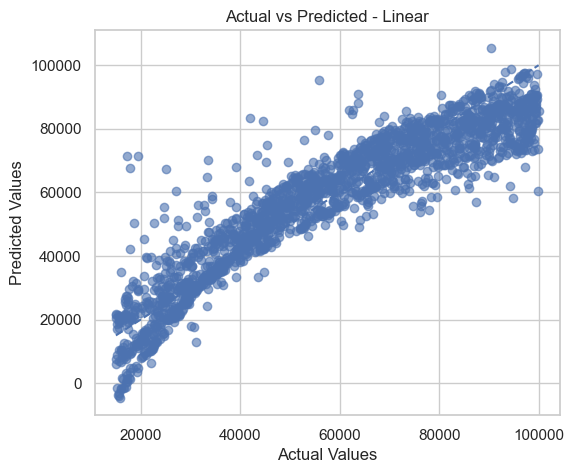

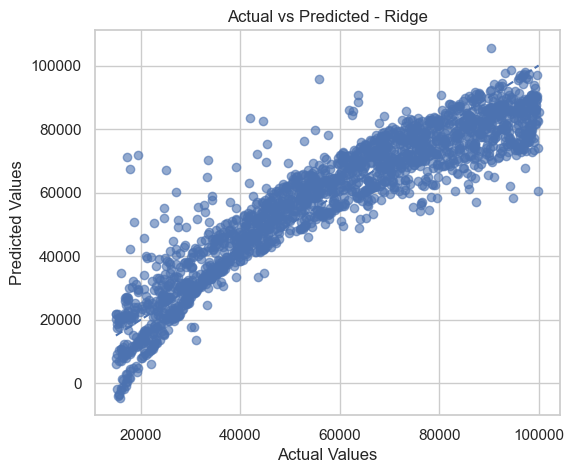

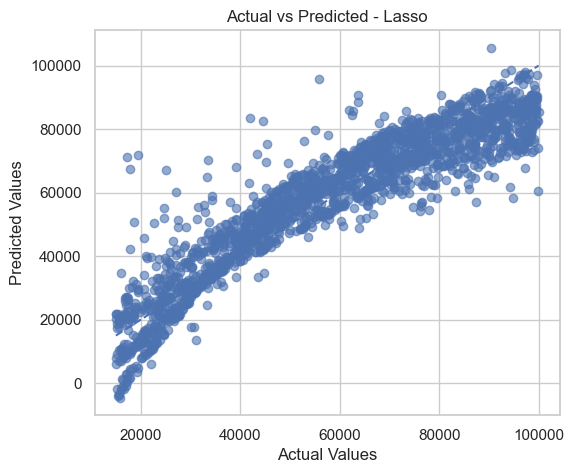

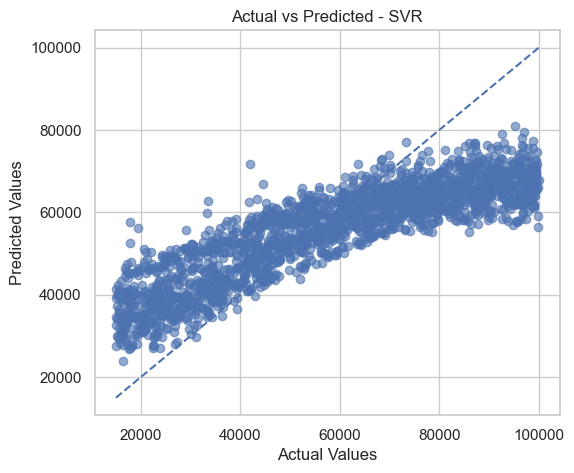

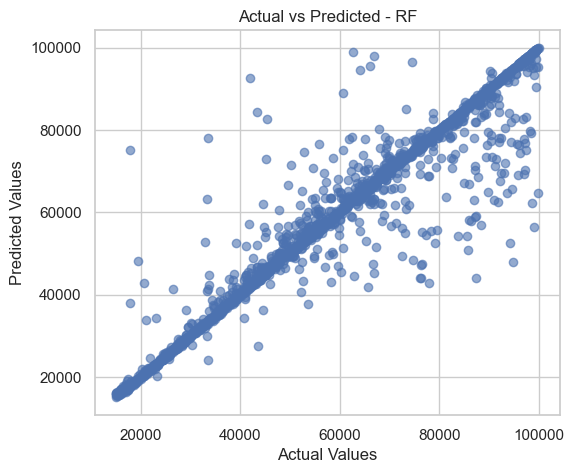

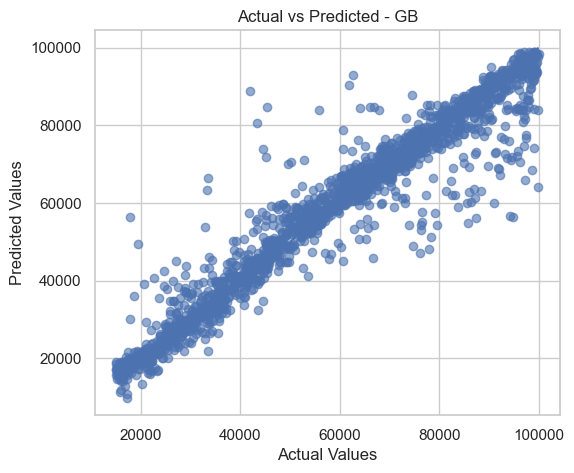

In [96]:
# Scatter plot: Actual vs Predicted
for name, pipe in pipelines.items():
    preds = pipe.predict(X_test)

    plt.figure(figsize=(6,5))
    plt.scatter(y_test, preds, alpha=0.6)
    
    # Perfect prediction line
    plt.plot([y_test.min(), y_test.max()],
             [y_test.min(), y_test.max()],
             linestyle='--')

    plt.title(f'Actual vs Predicted - {name}')
    plt.xlabel('Actual Values')
    plt.ylabel('Predicted Values')
    plt.grid(True)
    plt.show()


In [95]:

# models = ['GB', 'RF', 'Lasso', 'Ridge', 'Linear', 'SVR']
# fig, axes = plt.subplots(2, 3, figsize=(18, 10))
# axes = axes.flatten()

# for ax, model in zip(axes, models):
    
#     # Scatter plot
#     ax.scatter(y_test, preds[model], alpha=0.6)
    
#     # Perfect prediction line
#     ax.plot(
#         [y_test.min(), y_test.max()],
#         [y_test.min(), y_test.max()],
#         'r--'
#     )
    
#     ax.set_title(f"{model} | R² = {results[model]['R2']:.3f}", fontweight='bold')
#     ax.set_xlabel('Actual')
#     ax.set_ylabel('Predicted')
#     ax.grid(True)

# plt.suptitle('Actual vs Predicted — All Models', fontsize=16, fontweight='bold')
# plt.tight_layout()
# plt.show()


## XGBoost And catbooost

In [98]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from xgboost import XGBRegressor
from catboost import CatBoostRegressor

# --------------------- FEATURES & TARGET ---------------------
target = 'Sale_Price'
feat_cols = ['Price','Year','Car_Age','Quantity','Age','Discount_Pct',
             'Day_Of_Year','Is_Weekend','Brand_Prestige','Salesperson_Score',
             'Engine_Type','Transmission','Payment_Method','Gender','Brand']

X = data[feat_cols].copy()
y = data[target].copy()

# --------------------- TRAIN-TEST SPLIT ---------------------
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# --------------------- CATEGORICAL ENCODING ---------------------
cat_cols = ['Engine_Type','Transmission','Payment_Method','Gender','Brand']

# Label encode for XGBoost
for col in cat_cols:
    le = LabelEncoder()
    X_train[col] = le.fit_transform(X_train[col].astype(str))
    X_test[col]  = le.transform(X_test[col].astype(str))

# --------------------- SCALING NUMERIC ---------------------
num_cols = [c for c in feat_cols if c not in cat_cols]

scaler = StandardScaler()
X_train[num_cols] = scaler.fit_transform(X_train[num_cols])
X_test[num_cols]  = scaler.transform(X_test[num_cols])


In [99]:
# --------------------- XGBOOST REGRESSOR ---------------------
xgb_model = XGBRegressor(
    n_estimators=200,
    learning_rate=0.05,
    max_depth=6,
    subsample=0.8,
    colsample_bytree=0.8,
    random_state=42,
    verbosity=0
)

xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)



In [100]:
# --------------------- CATBOOST REGRESSOR ---------------------
# CatBoost handles categorical natively
cat_model = CatBoostRegressor(
    iterations=200,
    learning_rate=0.05,
    depth=6,
    random_state=42,
    verbose=0
)

# Provide categorical features as indices
cat_features_idx = [X_train.columns.get_loc(c) for c in cat_cols]

cat_model.fit(X_train, y_train, cat_features=cat_features_idx)
y_pred_cat = cat_model.predict(X_test)



In [101]:
results = {}

# XGBoost metrics
results['XGB'] = {
    'MAE'  : mean_absolute_error(y_test, y_pred_xgb),
    'RMSE' : np.sqrt(mean_squared_error(y_test, y_pred_xgb)),
    'R2'   : r2_score(y_test, y_pred_xgb)
}

# CatBoost metrics
results['CatB'] = {
    'MAE'  : mean_absolute_error(y_test, y_pred_cat),
    'RMSE' : np.sqrt(mean_squared_error(y_test, y_pred_cat)),
    'R2'   : r2_score(y_test, y_pred_cat)
}
results

{'XGB': {'MAE': 2481.5490166210943,
  'RMSE': 5778.234400362156,
  'R2': 0.9458519127720376},
 'CatB': {'MAE': 2881.5905078801957,
  'RMSE': 5756.558156018659,
  'R2': 0.946257408828802}}

In [102]:
# --------------------- DISPLAY RESULTS ---------------------
df_res_2 = pd.DataFrame(results).T.sort_values('R2', ascending=False)
print(df_res_2)

              MAE         RMSE        R2
CatB  2881.590508  5756.558156  0.946257
XGB   2481.549017  5778.234400  0.945852


In [103]:
#df_res_2 = pd.DataFrame(results).T.sort_values('R2', ascending=False)
df_res_2 = df_res_2.reset_index().rename(columns={'index':'Model'})
print(df_res_2)

  Model          MAE         RMSE        R2
0  CatB  2881.590508  5756.558156  0.946257
1   XGB  2481.549017  5778.234400  0.945852


In [104]:
df_res_2

,Model,MAE,RMSE,R2
0,CatB,2881.590508,5756.558156,0.946257
1,XGB,2481.549017,5778.234400,0.945852


In [105]:
df_res

,Model,MAE,RMSE,R2
5,GB,3615.935888,6338.059177,0.934851
4,RF,2336.290148,6399.780122,0.933576
2,Lasso,7336.016160,9616.549117,0.850021
1,Ridge,7336.476649,9616.724627,0.850015
0,Linear,7333.065240,9617.386541,0.849995
3,SVR,13153.270784,15958.829979,0.586957


## TIME-SERIES FORECASTING (Prophet + SARIMA)

In [107]:
from prophet import Prophet
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [108]:
data.head()

,Sale_ID,Customer_ID,Car_ID,Sale_Date,Quantity,Sale_Price,Payment_Method,Salesperson,Brand,Model,...,Is_Weekend,Cum_Revenue,Discount_Pct,Day_Of_Year,Age_Group,Price_Tier,Brand_Prestige,Salesperson_Score,Total_Spend,Is_High_Value
0,S07784,CU1432,C0266,2022-10-31,1,60976.18,Credit,Andre Burgess,Tesla,Model X,...,0,60976.18,0.000000,304,Boomer+ (56+),Premium ($60K-$100K),8080,7545,1097578.98,1
1,S02199,CU1297,C0440,2022-10-31,1,48094.44,Cash,Denise Washington,Tesla,Model 3,...,0,109070.62,37.671234,304,Gen X (41-55),Mid ($30K-$60K),8080,8422,1190009.99,1
2,S03688,CU0692,C0452,2022-10-31,1,69533.19,Installment,Blake Mcdaniel,Bmw,X5,...,0,178603.81,28.005088,304,Gen Z (≤25),Premium ($60K-$100K),714,6951,269055.76,1
3,S02901,CU0573,C0329,2022-10-31,1,15047.59,Cash,Patrick Barrett,Tesla,Model S,...,0,193651.40,82.681045,304,Boomer+ (56+),Budget (<$30K),8080,9994,938573.53,1
4,S01216,CU0634,C0348,2022-10-31,2,31746.92,Cash,Joseph Pratt,Hyundai,Tucson,...,0,257145.24,0.000000,304,Gen Z (≤25),Mid ($30K-$60K),9434,7372,218865.44,1


In [109]:
data.groupby('Sale_Date').agg(
    Sales_Count=('Sale_ID','count'),
    Revenue=('Revenue','sum')).reset_index().sort_values('Sale_Date')

,Sale_Date,Sales_Count,Revenue
0,2022-10-31,8,370036.73
1,2022-11-01,6,489336.20
2,2022-11-02,9,677018.01
3,2022-11-03,9,1168935.41
4,2022-11-04,9,1477277.32
...,...,...,...
1090,2025-10-26,8,1186280.50
1091,2025-10-27,6,514472.95
1092,2025-10-28,11,959027.86
1093,2025-10-29,10,804065.01


In [110]:
daily  = data.groupby('Sale_Date').agg(
    Sales_Count=('Sale_ID','count'),
    Revenue=('Revenue','sum')).reset_index().sort_values('Sale_Date')
daily.head()

,Sale_Date,Sales_Count,Revenue
0,2022-10-31,8,370036.73
1,2022-11-01,6,489336.20
2,2022-11-02,9,677018.01
3,2022-11-03,9,1168935.41
4,2022-11-04,9,1477277.32


In [111]:
# shape of the dataset
print(f'Rows in the dataframe: {daily.shape[0]}, Columns in the dataframe: {daily.shape[1]} & sales date ranges from {daily.Sale_Date.min().date()} to {daily.Sale_Date.max().date()}') 

Rows in the dataframe: 1095, Columns in the dataframe: 3 & sales date ranges from 2022-10-31 to 2025-10-30


### Prophet:
>We used Prophet to forecast daily revenue by handling seasonality, trend changes, and holidays.
The model provides confidence intervals and interpretable components, making it suitable for business forecasting.

In [112]:
prophet_df = daily[['Sale_Date', 'Sales_Count']].rename(columns = {'Sale_Date': 'ds', 'Sales_Count': 'y'})
prophet_df.head()

,ds,y
0,2022-10-31,8
1,2022-11-01,6
2,2022-11-02,9
3,2022-11-03,9
4,2022-11-04,9


In [113]:
prophet_sales_df = prophet_df.copy()

In [114]:
prophet_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1095 entries, 0 to 1094
Data columns (total 2 columns):
 #   Column  Non-Null Count  Dtype         
---  ------  --------------  -----         
 0   ds      1095 non-null   datetime64[ns]
 1   y       1095 non-null   int64         
dtypes: datetime64[ns](1), int64(1)
memory usage: 17.2 KB


In [115]:
#Basic data validation :
print(prophet_df.isna().sum())
print(prophet_df.head())

ds    0
y     0
dtype: int64
          ds  y
0 2022-10-31  8
1 2022-11-01  6
2 2022-11-02  9
3 2022-11-03  9
4 2022-11-04  9


In [117]:
train_sales  = prophet_df.iloc[:-30]
test_sales = prophet_df.iloc[-30:]

In [118]:
print(train_sales, test_sales)

             ds   y
0    2022-10-31   8
1    2022-11-01   6
2    2022-11-02   9
3    2022-11-03   9
4    2022-11-04   9
...         ...  ..
1060 2025-09-26   5
1061 2025-09-27  12
1062 2025-09-28   9
1063 2025-09-29   7
1064 2025-09-30   5

[1065 rows x 2 columns]              ds   y
1065 2025-10-01   3
1066 2025-10-02   5
1067 2025-10-03  10
1068 2025-10-04   6
1069 2025-10-05   9
1070 2025-10-06  11
1071 2025-10-07   9
1072 2025-10-08  12
1073 2025-10-09   7
1074 2025-10-10   5
1075 2025-10-11  20
1076 2025-10-12  13
1077 2025-10-13  11
1078 2025-10-14   9
1079 2025-10-15   7
1080 2025-10-16   9
1081 2025-10-17   5
1082 2025-10-18   9
1083 2025-10-19  10
1084 2025-10-20   6
1085 2025-10-21  12
1086 2025-10-22   6
1087 2025-10-23  12
1088 2025-10-24  17
1089 2025-10-25   9
1090 2025-10-26   8
1091 2025-10-27   6
1092 2025-10-28  11
1093 2025-10-29  10
1094 2025-10-30   5


In [119]:
# Prophet model initialization:
model = Prophet(
    daily_seasonality= True,
    yearly_seasonality=True,
    weekly_seasonality= True,
    changepoint_prior_scale= 0.1 # control the trend flexibility
)

In [120]:
# skip the holiday info: as it was not given:
# model.add_country_holidays(country_name = 'US')

# fit the model:
model.fit(prophet_df)

13:22:35 - cmdstanpy - INFO - Chain [1] start processing
13:22:36 - cmdstanpy - INFO - Chain [1] done processing


In [121]:
# Create future dates (30-day Forecast):
future_30 = model.make_future_dataframe(periods=30)
forecast_30 = model.predict(future_30)

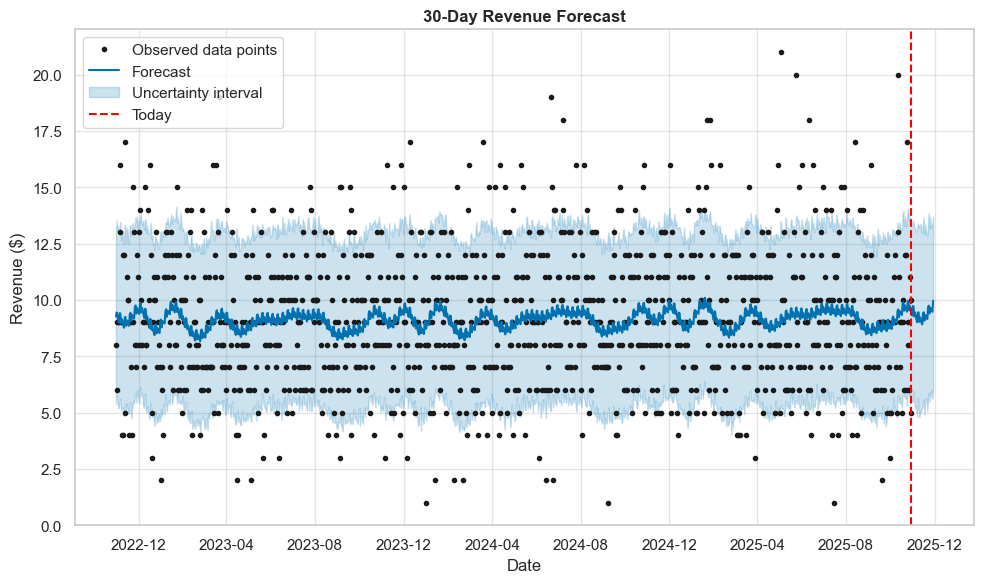

In [122]:
# Visualize 30-day forecast
fig = model.plot(forecast_30)
plt.axvline(prophet_df['ds'].max(), color='red', ls='--', label='Today')
plt.title('30-Day Revenue Forecast', fontweight='bold')
plt.xlabel('Date')
plt.ylabel('Revenue ($)')
plt.legend()
plt.tight_layout()
plt.show()

**Insights** from the **30-Day Revenue Forecast** plot:

* **Stable revenue pattern:** Revenue stays mostly within a consistent band, indicating no sharp structural changes.
* **Short-term predictability:** The forecast line closely follows historical behavior → model is reliable for **near-term planning**.
* **Limited upward/downward trend:** No strong long-term growth or decline; revenue appears **range-bound**.
* **Controlled uncertainty:** Prediction intervals are **narrow**, suggesting low volatility and good model confidence.
* **Occasional spikes & dips:** Outliers exist (black dots), likely due to **promotions, campaigns, or one-off events**.
* **Post-today forecast continuity:** After the red “Today” line, revenue is expected to **continue at similar levels** or Trends.
* **No strong seasonality impact:** Patterns repeat smoothly without large periodic swings.

### Business Insights: 

* Suitable for **operational forecasting**, budgeting, and short-term decision-making.
* Growth initiatives (pricing, marketing) are needed to **break the current revenue plateau**.

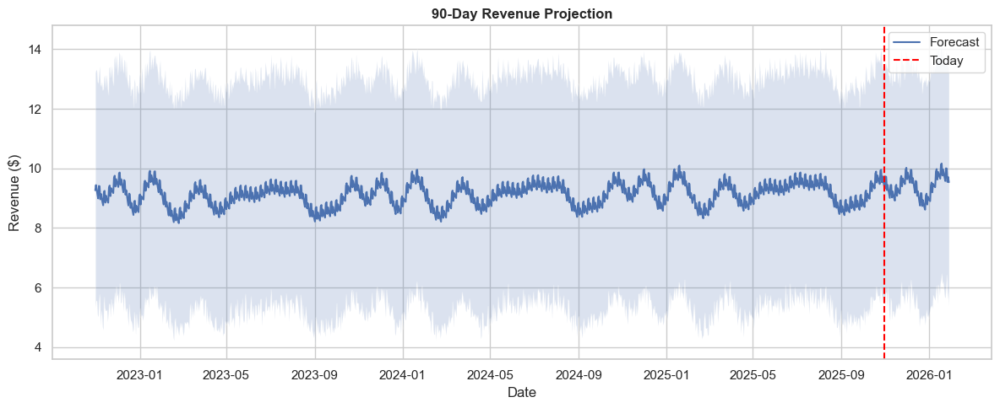

In [123]:
# Extend forecast to 90 days
future_90 = model.make_future_dataframe(periods=90)
forecast_90 = model.predict(future_90)

#Plot 90-day projection
plt.figure(figsize=(12,5))
plt.plot(forecast_90['ds'], forecast_90['yhat'], label='Forecast')
plt.fill_between(
    forecast_90['ds'],
    forecast_90['yhat_lower'],
    forecast_90['yhat_upper'],
    alpha=0.2
)
plt.axvline(prophet_df['ds'].max(), color='red', ls='--', label='Today')
plt.title('90-Day Revenue Projection', fontweight='bold')
plt.xlabel('Date')
plt.ylabel('Revenue ($)')
plt.legend()
plt.tight_layout()
plt.show()


In [124]:
#Business metric – Expected revenue next 90 days:
next_90_revenue = forecast_90[forecast_90['ds']> prophet_df['ds'].max()]['yhat'].sum()
print(f'Projected revenue for the next 90 day: ${next_90_revenue:,.0f}')

Projected revenue for the next 90 day: $848


**Insights** from the **90-Day Revenue Projection**:

* **Revenue remains stable over the next 90 days**, with no major upward or downward trend expected.
* **Forecast follows historical patterns**, indicating the model has captured underlying demand behavior well.
* **Uncertainty band widens slightly over time**, which is normal for longer forecast horizons.
* **No structural break after “Today”**, meaning business is expected to operate under similar conditions.
* **Average revenue expected to stay in the same range** as recent months.
* **Extreme outcomes are unlikely**, as forecast bounds remain controlled.

### Business insights:

* Suitable for **quarterly planning and cash-flow forecasting**.
* To achieve higher growth, **external interventions** (marketing, pricing, expansion) will be required rather than relying on organic trend.

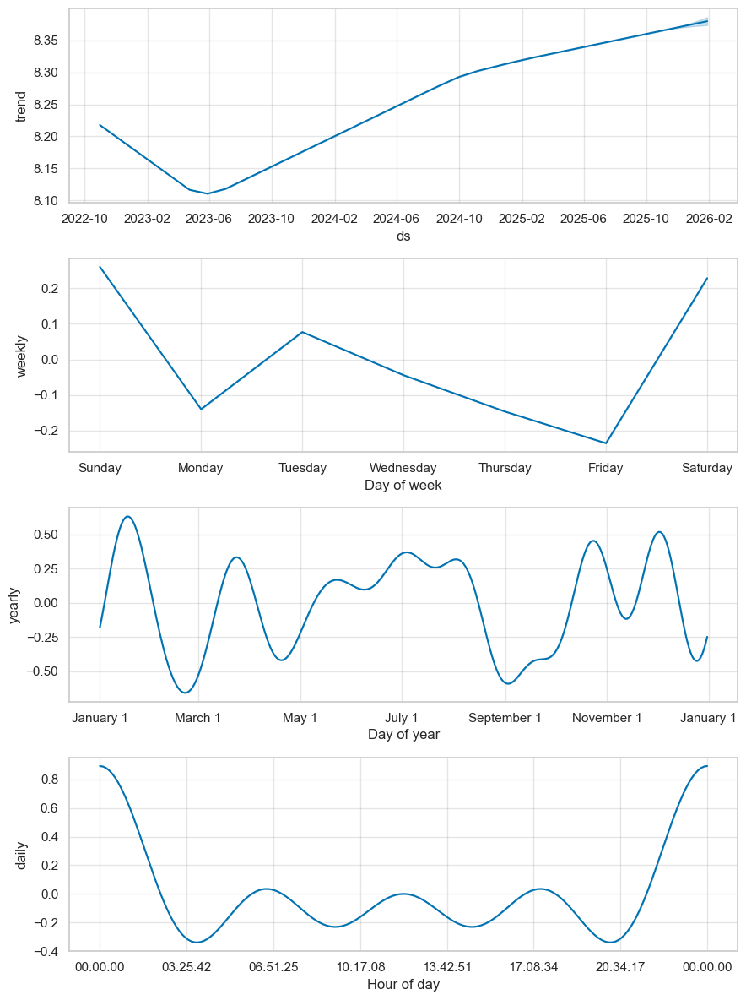

In [125]:
#Component analysis:
model.plot_components(forecast_90)
plt.tight_layout()
plt.show()

**Insights** from the **Prophet component analysis** (Trend, Weekly, Yearly, Daily):

---

## 📈 Trend Component

* **Initial dip followed by steady growth** from mid-2023 onward.
* Indicates **recovery and gradual business expansion** rather than aggressive growth.
* Trend slope is smooth → no structural breaks or shocks.
* Long-term revenue is **slowly improving but stable in nature**.

---

## 📅 Weekly Seasonality

* **Highest revenue on Sunday and Saturday**

>Strong **weekend effect**.
    
* **Lowest revenue on Friday**
>Possible customer fatigue or operational constraints.


📌 **Actionable Insight:**
Increase promotions or staffing on weekends; experiment with **Friday incentives**.

---

## 📆 Yearly Seasonality

* **Multiple peaks and troughs across the year**
* Strong performance around:

>Early January
>Mid-year (June–July)
>November period

* Weaker demand around:

>Late February–March
>Early September

📌 **Actionable Insight:**
Plan marketing campaigns around **high-performing months** and cost optimization during slow periods.

---

## ⏰ Daily (Hourly) Seasonality

* **Strong spike late night / early morning**
* **Revenue drops in early morning hours**
* Smaller peaks during:
>Morning
>Early evening

📌 **Actionable Insight:**
Optimize ad spend, push notifications, and system readiness during **high-traffic hours**.

---

## 🎯 Overall Business Takeaway

* Revenue is driven more by **seasonal patterns** than sharp trends.
* **Weekend and time-of-day effects are stronger** than yearly trend.
* Prophet has successfully captured:

  * Long-term direction
  * Short-term behavioral cycles
  * Intra-day demand fluctuations


## SARIMAX:

In [127]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

In [131]:
data.groupby('Sale_Date', as_index=False)['Revenue'].sum()[:5]

,Sale_Date,Revenue
0,2022-10-31,370036.73
1,2022-11-01,489336.20
2,2022-11-02,677018.01
3,2022-11-03,1168935.41
4,2022-11-04,1477277.32


In [130]:
#Prepare & Validate Data(aggregate to daily revenue):
daily_sm = data.groupby('Sale_Date', as_index=False)['Revenue'].sum()
daily_sm['Sale_Date'] = pd.to_datetime(daily_sm['Sale_Date'])
daily_sm = daily_sm.sort_values('Sale_Date')
daily_sm.head()

,Sale_Date,Revenue
0,2022-10-31,370036.73
1,2022-11-01,489336.20
2,2022-11-02,677018.01
3,2022-11-03,1168935.41
4,2022-11-04,1477277.32


In [132]:
# set date as index
ts = daily.set_index('Sale_Date')['Revenue']
ts

Sale_Date
2022-10-31     370036.73
2022-11-01     489336.20
2022-11-02     677018.01
2022-11-03    1168935.41
2022-11-04    1477277.32
                 ...    
2025-10-26    1186280.50
2025-10-27     514472.95
2025-10-28     959027.86
2025-10-29     804065.01
2025-10-30     609690.12
Name: Revenue, Length: 1095, dtype: float64

In [134]:
# data validation:
print('Checking for null val;',ts.isna().sum())
# if present:
ts = ts.asfreq('D')              # Daily frequency
ts = ts.fillna(method='ffill')   # Forward fill

Checking for null val; 0


In [139]:
ts.index[int(len(ts) * 0.8)]

Timestamp('2025-03-25 00:00:00')

In [140]:
# Train–Test Split:
split_date = ts.index[int(len(ts) * 0.8)]

train = ts[ts.index <= split_date]
test  = ts[ts.index > split_date]

In [145]:
# Stationarity Check (Industry Standard)
from statsmodels.tsa.stattools import adfuller

adf = adfuller(train)
print(f"ADF p-value: {adf[1]:.4f}") # it is stationary
print(" if p > 0.05 → non-stationary → differencing neededSARIMAX handles this internally via (d, D)")

ADF p-value: 0.0000
 if p > 0.05 → non-stationary → differencing neededSARIMAX handles this internally via (d, D)


In [148]:
#Define SARIMAX Model Parameters
#base model:
order = (1, 1, 1)          # ARIMA(p,d,q)
seasonal_order = (1, 1, 1, 7)   # Weekly seasonality

In [147]:
sarimax = SARIMAX(
    train,
    order=order,
    seasonal_order=seasonal_order,
    enforce_stationarity=False,
    enforce_invertibility=False
)

sarimax_model = sarimax.fit(disp=False)
print(sarimax_model.summary())

                                     SARIMAX Results                                     
Dep. Variable:                           Revenue   No. Observations:                  877
Model:             SARIMAX(1, 1, 1)x(1, 1, 1, 7)   Log Likelihood              -12507.384
Date:                           Sat, 03 Jan 2026   AIC                          25024.769
Time:                                   13:40:35   BIC                          25048.554
Sample:                               10-31-2022   HQIC                         25033.875
                                    - 03-25-2025                                         
Covariance Type:                             opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.0044      0.084      0.052      0.958      -0.160       0.169
ma.L1         -0.8747      0.043    -20.168

In [149]:
# forecast on test data:
pred = sarimax_model.get_forecast(steps=len(test))
pred_mean = pred.predicted_mean
pred_ci = pred.conf_int()

In [150]:
#Model Evaluation (MAE, RMSE, R²)
mae  = mean_absolute_error(test, pred_mean)
rmse = np.sqrt(mean_squared_error(test, pred_mean))
r2   = r2_score(test, pred_mean)

print(f"SARIMAX MAE  : {mae:.2f}")
print(f"SARIMAX RMSE : {rmse:.2f}")
print(f"SARIMAX R²   : {r2:.4f}")

SARIMAX MAE  : 452879.92
SARIMAX RMSE : 533731.20
SARIMAX R²   : -0.5076


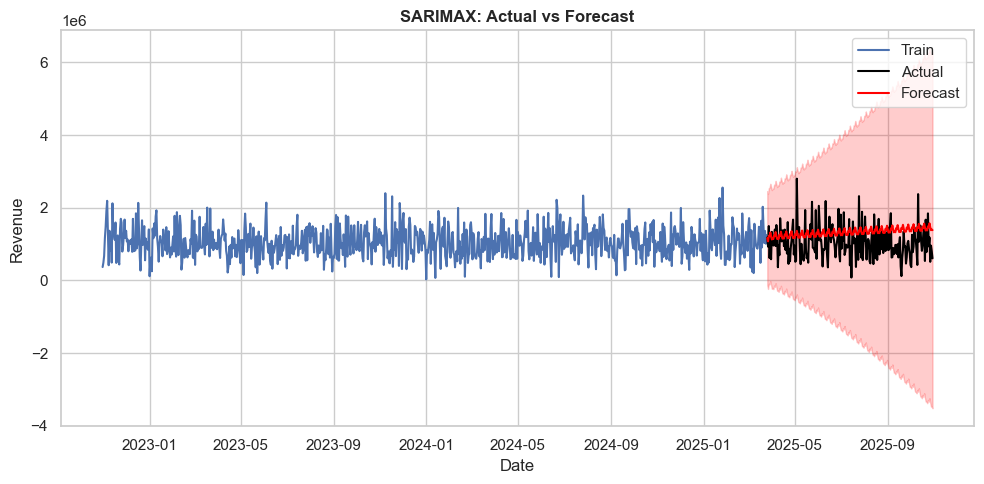

In [151]:
#Actual vs Predicted Plot
plt.figure(figsize=(10,5))
plt.plot(train.index, train, label='Train')
plt.plot(test.index, test, label='Actual', color='black')
plt.plot(test.index, pred_mean, label='Forecast', color='red')
plt.fill_between(
    pred_ci.index,
    pred_ci.iloc[:,0],
    pred_ci.iloc[:,1],
    color='red', alpha=0.2
)
plt.title('SARIMAX: Actual vs Forecast', fontweight='bold')
plt.xlabel('Date')
plt.ylabel('Revenue')
plt.legend()
plt.tight_layout()
plt.show()


In [152]:
#Forecast Future (30 / 90 Days)
future_steps = 90
future_forecast = sarimax_model.get_forecast(steps=future_steps)

future_mean = future_forecast.predicted_mean
future_ci = future_forecast.conf_int()


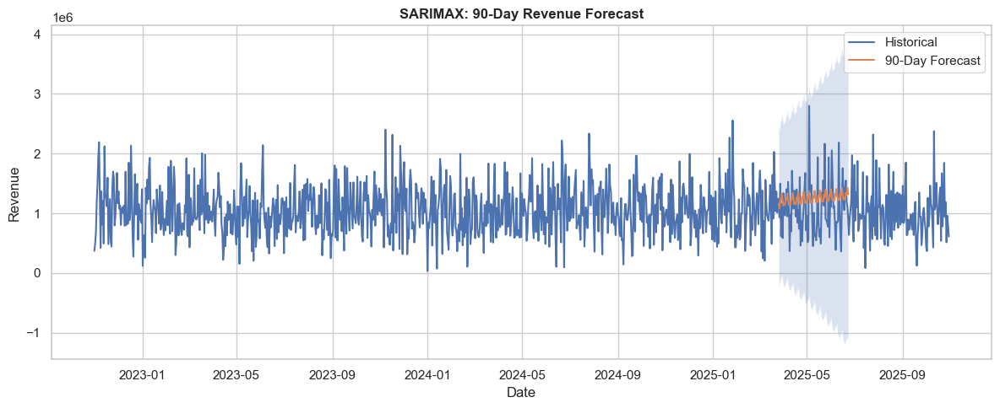

In [153]:
plt.figure(figsize=(12,5))
plt.plot(ts, label='Historical')
plt.plot(future_mean.index, future_mean, label='90-Day Forecast')
plt.fill_between(
    future_ci.index,
    future_ci.iloc[:,0],
    future_ci.iloc[:,1],
    alpha=0.2
)
plt.title('SARIMAX: 90-Day Revenue Forecast', fontweight='bold')
plt.xlabel('Date')
plt.ylabel('Revenue')
plt.legend()
plt.tight_layout()
plt.show()


In [154]:
next_90_revenue = future_mean.sum()
print(f"Projected revenue (next 90 days): ${next_90_revenue:,.0f}")


Projected revenue (next 90 days): $112,599,176


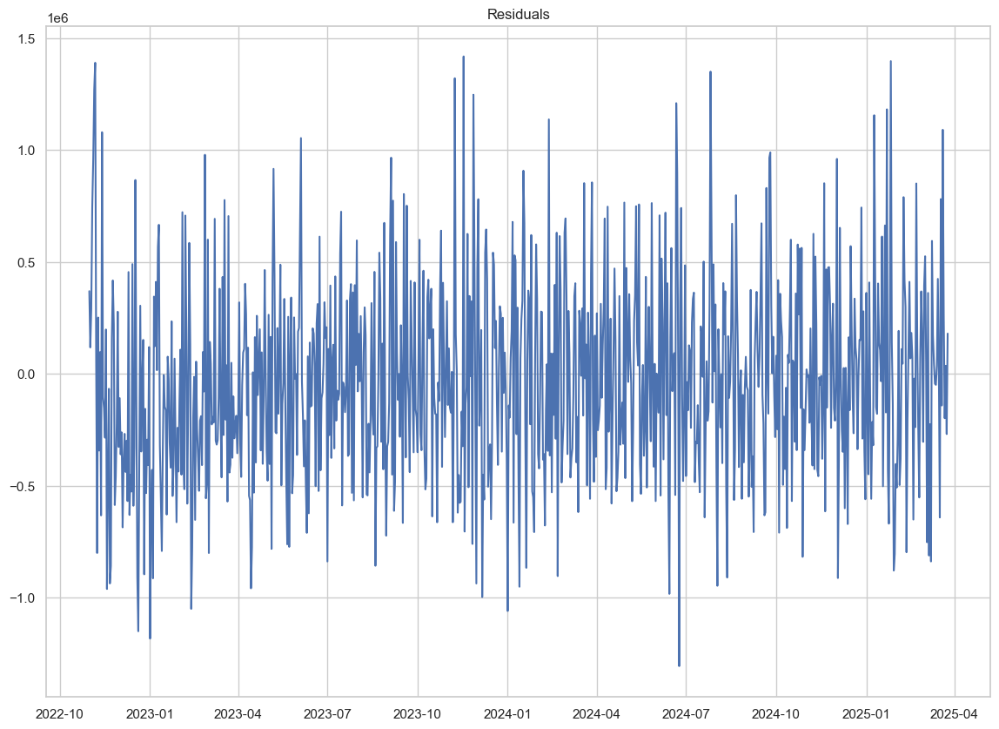

In [155]:
residuals = sarimax_model.resid
plt.plot(residuals); plt.title('Residuals'); plt.show()


## Important note:

AUTO-SARIMA(pmdarima):
> Is a python library that automates the process of findidng the optimal parameters for ARIMA(AutoRegressive intergrated moving average) and SARIMA(Seasonal ARIMA) time series model.

In [159]:
from statsmodels.tsa.stattools import adfuller

result = adfuller(ts)
print(f"ADF p-value: {result[1]:.4f}")


ADF p-value: 0.0000


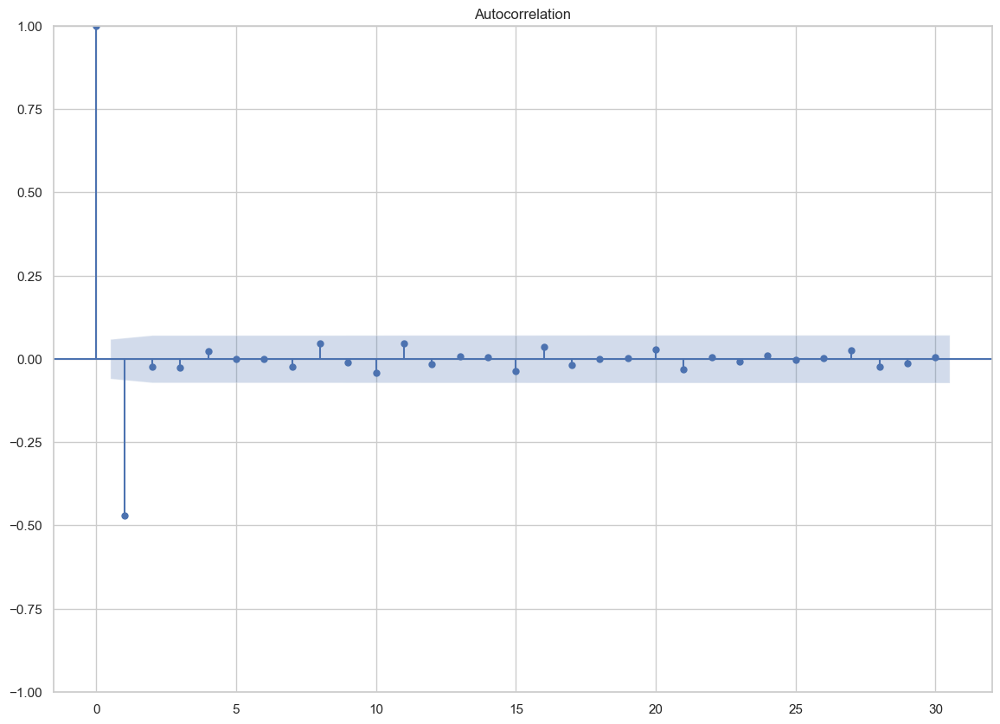

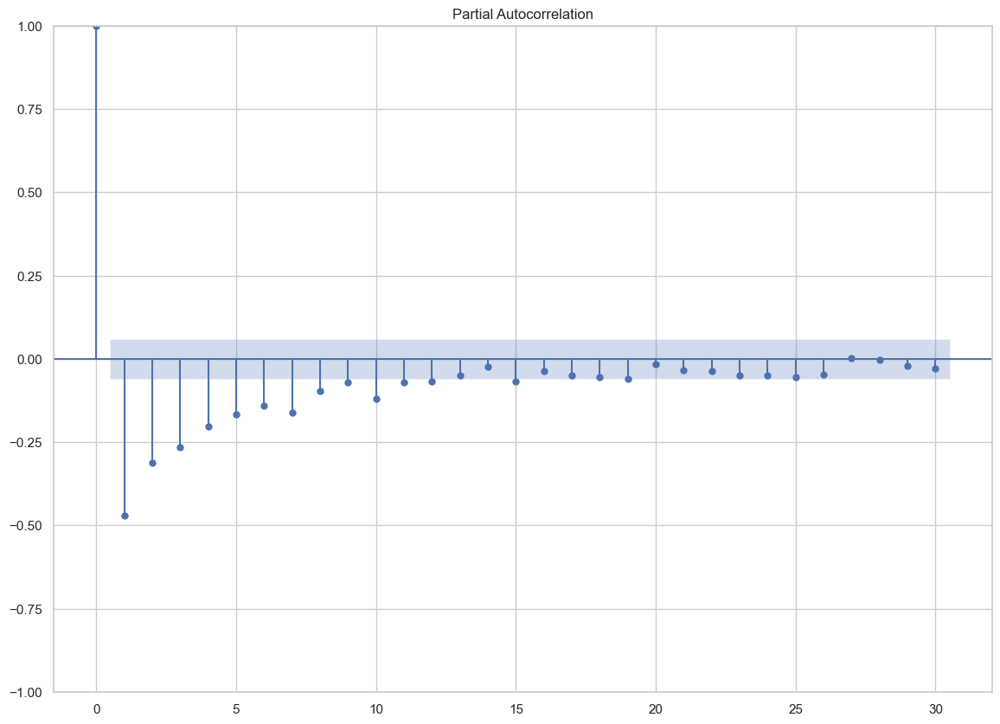

In [161]:
ts_diff = ts.diff().dropna()
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import matplotlib.pyplot as plt

plot_acf(ts_diff, lags=30)
plot_pacf(ts_diff, lags=30)
plt.show()


In [163]:
# # Hyperparameter tuning:
# import itertools
# from statsmodels.tsa.statespace.sarimax import SARIMAX

# p = q = range(0, 3)
# d = [1]
# P = Q = range(0, 2)
# D = [1]
# s = 7

# best_aic = float("inf")
# best_order = None

# for order in itertools.product(p, d, q):
#     for seasonal in itertools.product(P, D, Q):
#         try:
#             model = SARIMAX(
#                 ts,
#                 order=order,
#                 seasonal_order=(seasonal[0], seasonal[1], seasonal[2], s),
#                 enforce_stationarity=False,
#                 enforce_invertibility=False
#             ).fit(disp=False)

#             if model.aic < best_aic:
#                 best_aic = model.aic
#                 best_order = (order, seasonal)

#         except:
#             continue

# print("Best SARIMA:", best_order, "AIC:", best_aic)
